# K-means

## 1 - Introdução

*Análise de agrupamento* $\rightarrow$ *Redução de dimensionalidade*
- Em PCA se faz a redução da dimensionalidade das colunas, features
- Com clusters é feita a redução da dimensionalidade das linhas
- Ao invés de avaliar milhões de indivíduos, avalia-se grupos semelhantes

Agrupamento é uma subcategoria de *técnicas de aprendizado não supervisionado* que nos permite descobrir estruturas escondidas nos dados. Encontrar grupos (clusters) cujos itens são mais semelhantes entre si do que àqueles de outros agrupamentos.


**Algoritmos de agrupamento (não supervisionados)**:
- K-means (entre os mais populares se não o mais popular)
- Métodos hierárquicos
- Mistura gaussiana
- DBScan
- Mini-Batch-K-means

> **É sempre importante relembrar o CRISP-DM**
>
> 
> Business understanding --> Data understanding --> Data preparation --> Modeling --> Evaluation --> Deployment

## 2 - Primeiro contato com a técnica

**O problema**:
- Encontrar grupos de pinguins com padrões biométricos parecidos
- Pinguins típicos de grupos diferentes devem ter diferenças marcantes

#### Análise de agrupamentos 

Vamos falar de análise de agrupamentos (*cluster*), com mais foco para o algoritmo **k-means**, o mais popular em ciência de dados para esta finalidade.

In [8]:
# importando pacotes
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Importando K-means
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

##### Aplicação 

Vamos aplicar o algoritmo de cluster na base de pinguins.

|     Função       |       Descrição       |
| -- | -- |
|     KMeans       | É a função do scikitlearn que faz o algoritmo k-means |
|   StandardScaler | É uma função que faz padronização de variáveis (*Scalling*) |

##### Carregando dados
O K-means não suporta valores faltantes (*missing*), então vamos fazer uma substituição pelo valor médio de cada variável quantitativa. O K-means trabalha somente com variáveis quantitativas. É possível utilizar variáveis dummy, mas há formas melhores de se trabalhar com variáveis qualitativas.

Por hora, vamos nos ater às variáveis quantitativas.

In [11]:
penguins = sns.load_dataset('penguins')
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


In [12]:
# Missing
penguins.isna().sum()

species               0
island                0
bill_length_mm        2
bill_depth_mm         2
flipper_length_mm     2
body_mass_g           2
sex                  11
dtype: int64

In [13]:
# Localizando dados faltantes
penguins[penguins.body_mass_g.isna()]

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN


In [14]:
# Removendo dados missing
penguins.dropna(subset=['body_mass_g'], inplace=True)

In [15]:
# Selecionando apenas variáveis numéricas

penguins_quant = penguins.select_dtypes(include='number')
penguins_quant.head()

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g
0,39.1,18.7,181.0,3750.0
1,39.5,17.4,186.0,3800.0
2,40.3,18.0,195.0,3250.0
4,36.7,19.3,193.0,3450.0
5,39.3,20.6,190.0,3650.0


##### Análise descritiva

Vamos gerar uma matriz de gráfico de dispersão (*scatter matrix*) para verificar se há algum padrão evidente nos dados.

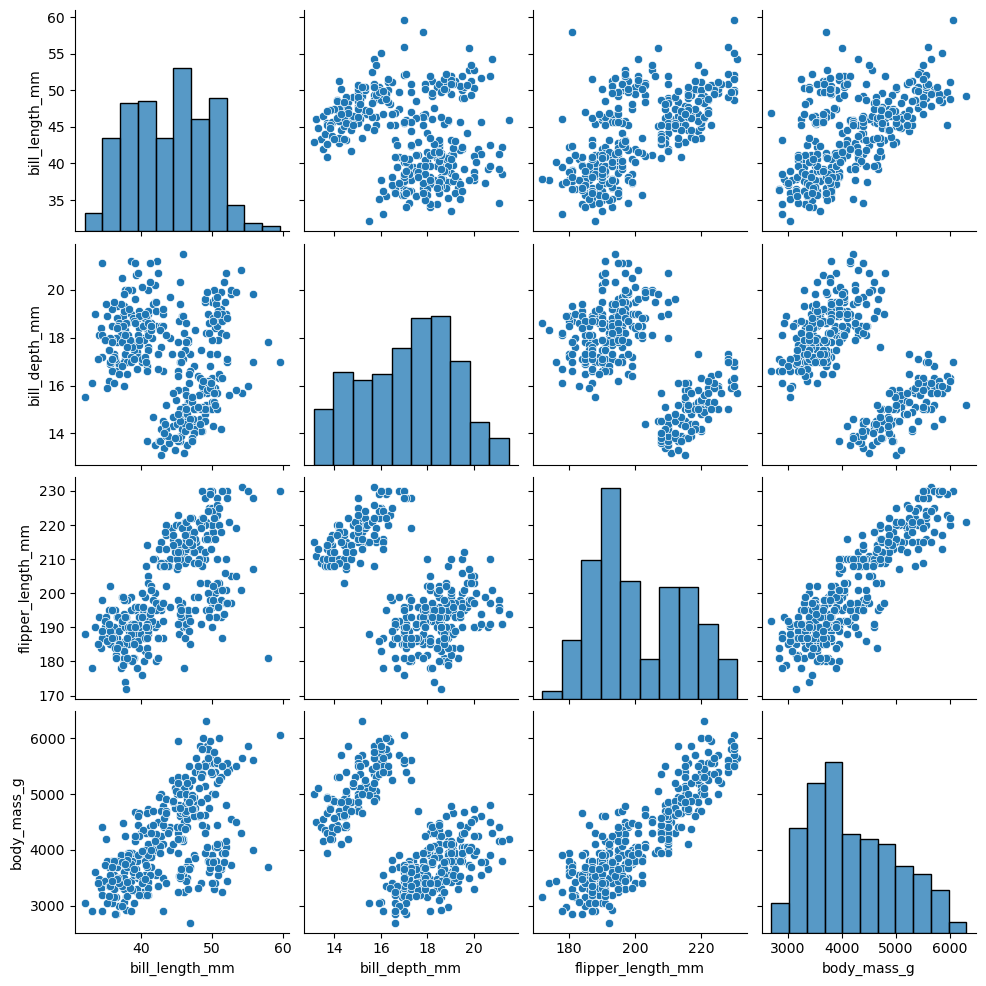

In [17]:
sns.pairplot(penguins)
plt.savefig('./output/1-pairplot.png', dpi=200)

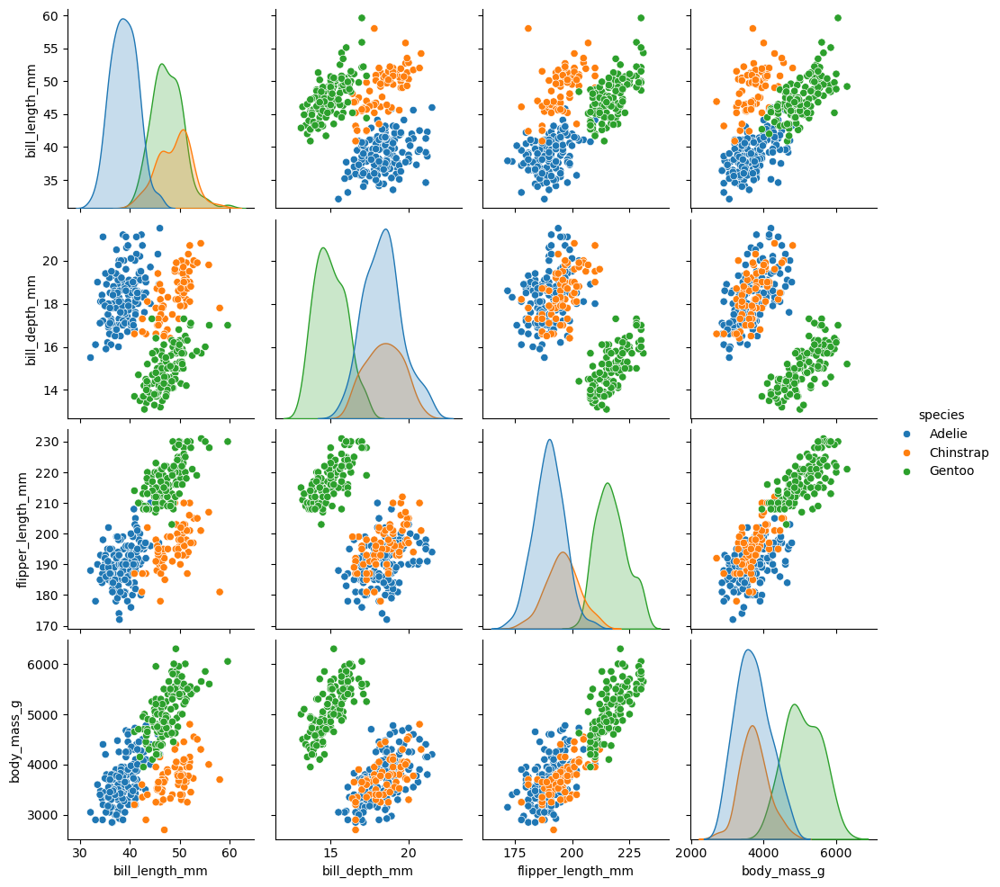

In [18]:
sns.pairplot(penguins, hue='species')
plt.savefig('./output/2-pairplot.png', dpi=200)

#### Rodando o algoritmo

Vamos definir um objeto como a `classe KMeans` e vamos aplicar o método `fit`, indicando a base de dados.

In [77]:
kmeans = KMeans(n_clusters=3, 
                max_iter=600, 
                algorithm='lloyd',
                verbose=True
               )
kmeans.fit(penguins_quant)

Initialization complete
Iteration 0, inertia 47826901.160000004.
Iteration 1, inertia 38591558.147924915.
Iteration 2, inertia 35506763.96719482.
Iteration 3, inertia 34156512.20508854.
Iteration 4, inertia 33700511.27130101.
Iteration 5, inertia 33434901.996956162.
Iteration 6, inertia 33028962.073427975.
Iteration 7, inertia 32406163.601797562.
Iteration 8, inertia 32010964.909980513.
Iteration 9, inertia 31762890.627498444.
Iteration 10, inertia 31076310.975205258.
Iteration 11, inertia 30097191.852684464.
Iteration 12, inertia 29717707.875312574.
Iteration 13, inertia 29652295.49313035.
Converged at iteration 13: strict convergence.


C:\Users\duduj\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


KMeans(max_iter=600, n_clusters=3, verbose=True)

Podemos identificar os grupos com o atributo `labels_`. Vamos construir um gráfico de dispersão para ver como esses grupos ficaram.

In [80]:
kmeans.labels_

array([0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2,
       0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0,
       2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0,
       0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0,
       2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0,
       2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 2,
       1, 2, 1, 1, 2, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1, 2,
       1, 1, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 2, 1,
       1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 2,
       1, 2, 1, 2, 1, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1,

In [82]:
penguins['grupo'] = kmeans.labels_.astype('str')
print(penguins.grupo.value_counts())
penguins.head()

grupo
0    144
2    117
1     81
Name: count, dtype: int64


,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,grupo
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male,0
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female,0
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female,0
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female,0
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,Male,0


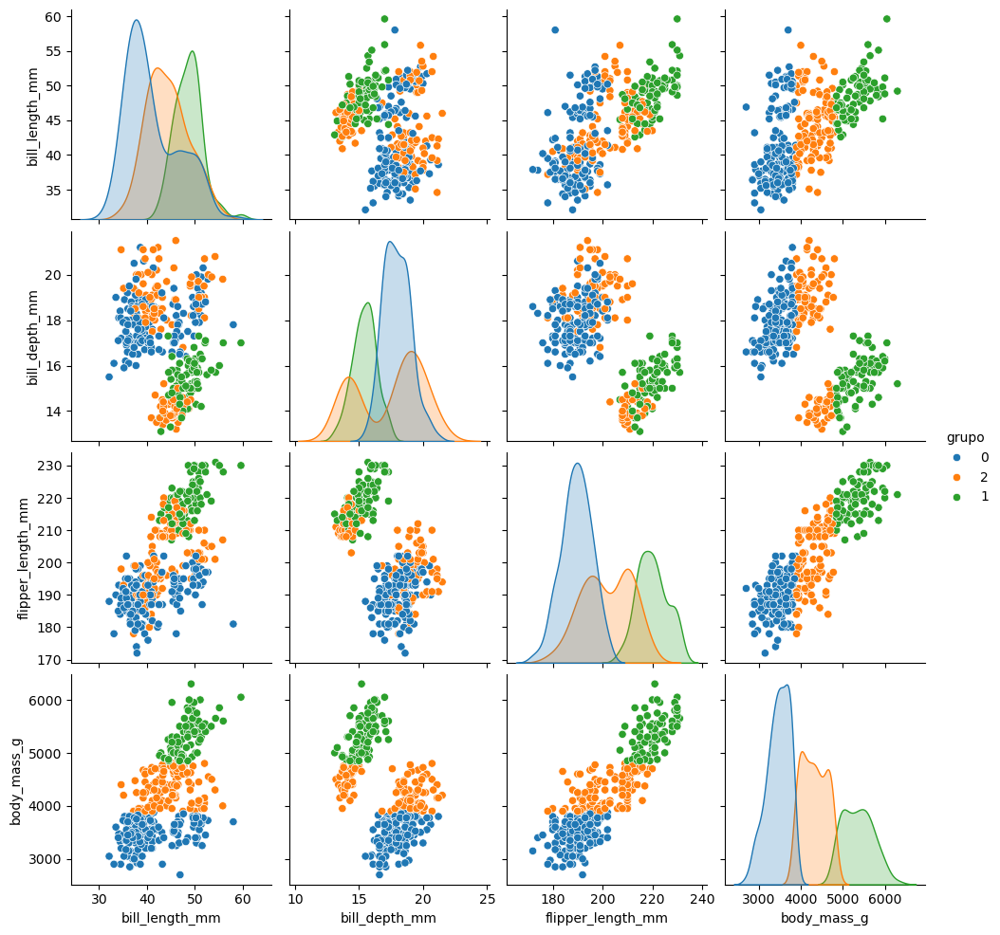

In [84]:
sns.pairplot(penguins, hue='grupo')
plt.savefig('./output/3-kmeans1.png', dpi=200)

Os grupos ficaram um tanto esquisitos... os gráficos de baixo estão com um aspecto de "bandeira". O que aconteceu é que o algoritmo utilizou quase que somente a variável ```body_mass```. Por que? 

Bem, repare na escala dessa variável, ela está em gramas e fornece valores muito maiores que as demais variáveis. Faça o exercício de calcular a distância entre um par de pinguins, e você vai confirmar que a contribuição da variável ```body_mass``` é muito maior que as demais variáveis.


Podemos dizer que o algoritmo deu errado, pois não traz dados interessantes, relevantes ou que façam muito sentido.


## 3 - Distância


Para fazer o agrupamento, o algoritmo usa uma medida de *dissimilaridade* ou simplesmente distância (o quanto duas observações são diferentes) para agrupar os pinguins. A medida mais comum, a que usaremos, é a distância euclidiana calculada nas variáveis quantitativas entre dois indivíduos (```a``` e ```b```) pode ser escrita como:

$$ d = \sqrt{\sum_{i=1}^{p} (\delta(x_i))^2} $$

com:
- $x_i$ sendo a i-ésima variável
- i indexando as variáveis, valendo 1, 2, ... p
- p é o número de variáveis
- $\delta(x_i) = x_{i, a} - x_{i, b}$ é a diferença da variável $x_i$ entre os indivíduos a e b.

##### Variáveis em escalas diferentes
Variáveis com unidades de medida diferentes frequentemente fornecem escalas diferentes, como no caso dos pinguins. Quando calculamos uma distância considerando estas variáveis tão diferentes, estamos realizando uma "ponderação arbitrária".
- **Ponderação** porque estamos dando pesos ou importâncias diferentes para cada variável
- **Arbitrária** porque podemos medir a massa corporal em quilos ou toneladas, sem alterar a informação que a variável traz, mas alterando
- **arbitrariamente** a importância que ela teria no algoritmo.

## Como resolver o problema de escala?

Ok, como resolvemos isso? 

Uma forma muito popular de abordar este problema é realizar uma alteração de escala padronizada (um *scaling* em inglês) nas variáveis quantitativas. Para qual escala podemos transformar? Se dividirmos cada variável pelo seu desvio padrão, a unidade de medida da variável fica 'adimensional' - ou podemos entender que uma unidade equivale a 1 desvio padrão (vale refletir a respeito). Costuma-se também subtrair a própria média da variável, de modo que ela fique com média=0 e desvio padrão = 1.

Essa padronização pode ser escrita assim:

$$ x_{pad} = \frac{x - \bar{x}}{desv\_pad(x)} $$

A função ```StandardScaler``` faz isso de forma bem prática.

In [89]:
padronizador = StandardScaler()
penguin_padronizado = padronizador.fit_transform(penguins_quant)

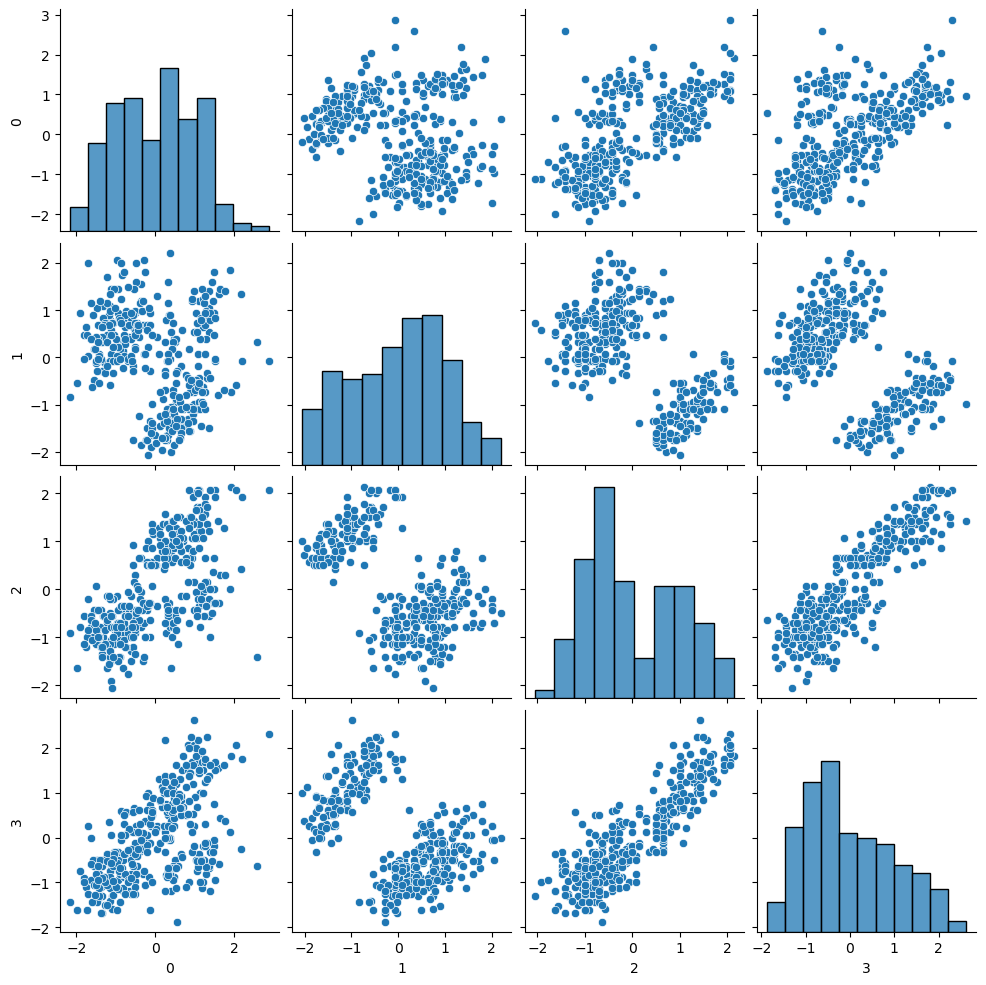

In [90]:
sns.pairplot(pd.DataFrame(penguin_padronizado))

Agora as variáveis possuem média zero e desvio padrão 1. Se agrupam entre -2 e 2.

In [95]:
# Aplicando o fit para os dados padronizados

kmeans.fit(penguin_padronizado)

Initialization complete
Iteration 0, inertia 597.0090866197608.
Iteration 1, inertia 516.794273138655.
Iteration 2, inertia 494.1237309388123.
Iteration 3, inertia 489.15134625646436.
Iteration 4, inertia 487.1362151810801.
Iteration 5, inertia 486.54558985333404.
Iteration 6, inertia 486.42883971618335.
Iteration 7, inertia 486.39766978918044.
Iteration 8, inertia 486.33072138152687.
Iteration 9, inertia 486.29748054807624.
Converged at iteration 9: strict convergence.


C:\Users\duduj\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


KMeans(max_iter=600, n_clusters=3, verbose=True)

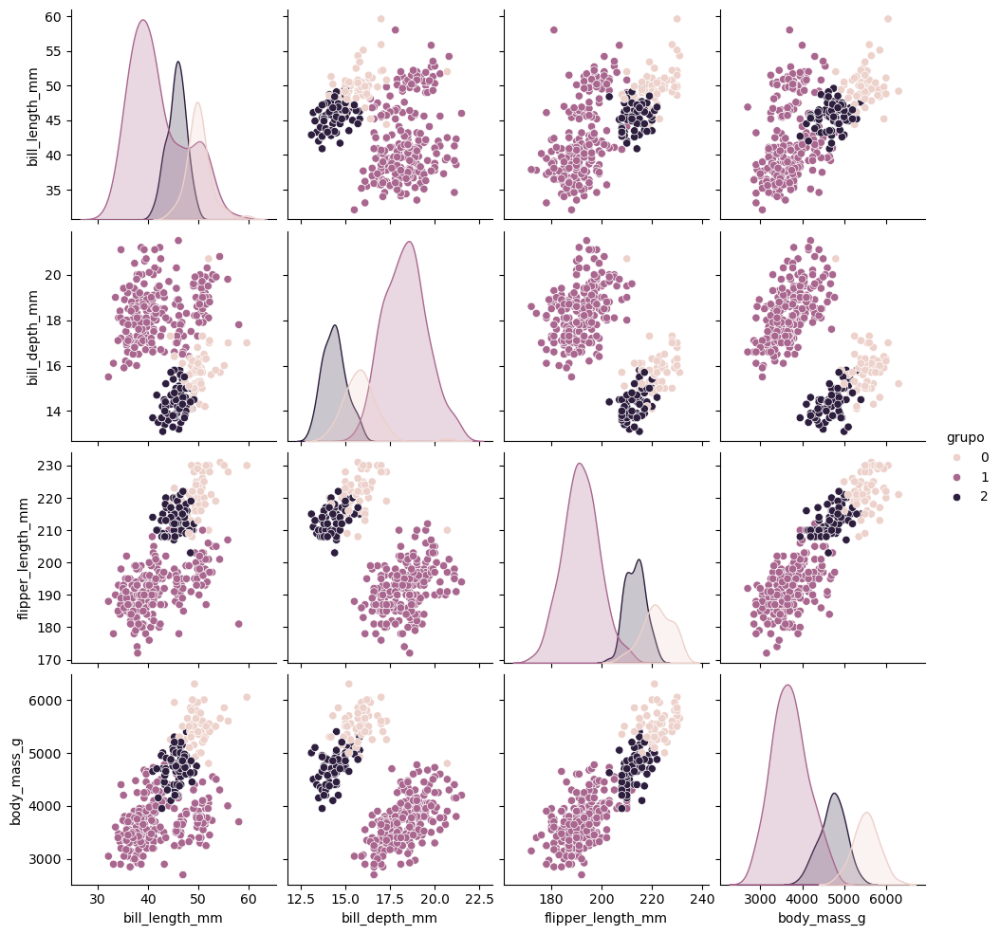

In [97]:
# Vejamos como ficam os grupos

penguins['grupo'] = kmeans.labels_
sns.pairplot(penguins, hue='grupo')
plt.savefig('./output/4-kmeans2.png', dpi=200)

Agora a análise considera igualmente todas as variáveis. Vamos checar como fica a mesma análise se realçarmos no `hue` as espécies de pinguim.

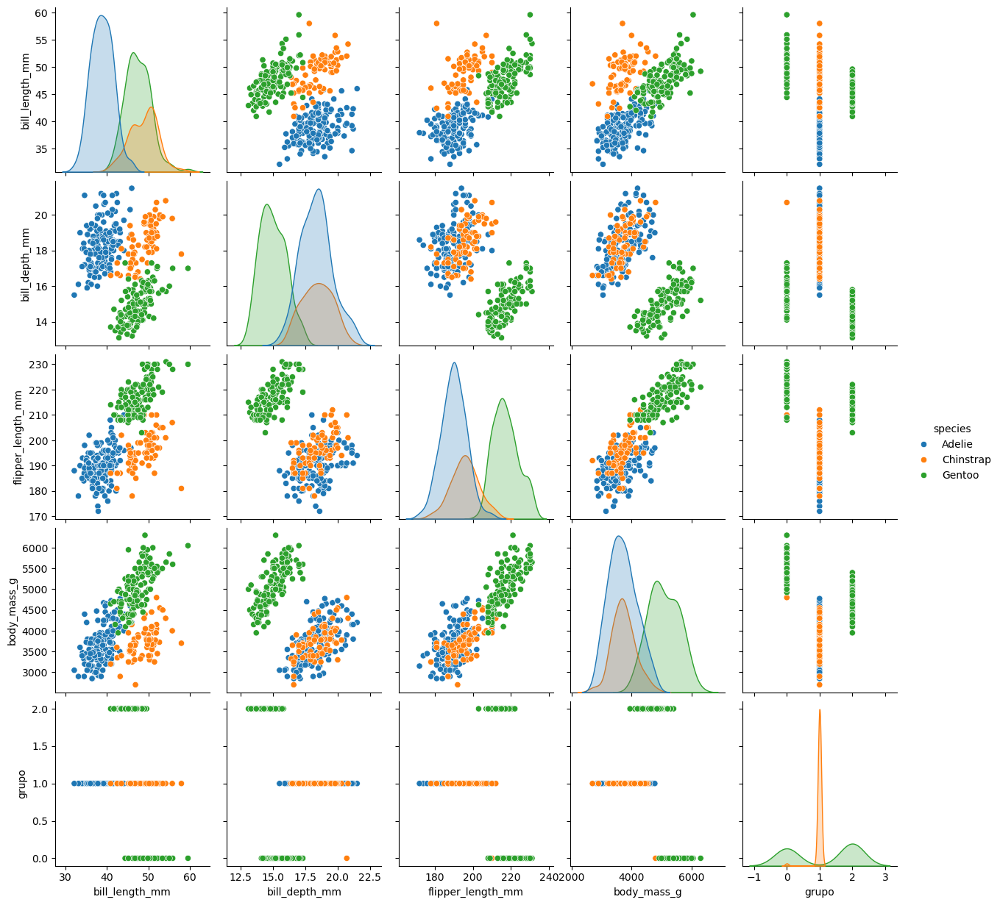

In [100]:
sns.pairplot(penguins, hue='species')
plt.savefig('./output/5-kmeans-3.png', dpi=200)

In [101]:
# Avaliando os dados em uma tabela cruzada
pd.crosstab(penguins['species'], penguins['grupo'])

grupo,0,1,2
species,,,
Adelie,0,151,0
Chinstrap,1,67,0
Gentoo,54,0,69


Os grupos têm uma boa concordância com as espécies! Mas não se esqueça: não estamos tentando 'acertar' as espécies, mas sim encontrar padrões entre as variáveis biométricas dos pinguins e dividi-los em grupos de pinguins *semelhantes dentro do grupo e diferentes entre grupos*. A concordância é uma curiosa e feliz coincidência.

## 4 - Como o algoritmo funciona

In [105]:
# Bibliotecas 

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import distance #Para calcular a distância entre os pontos

#### Algoritmo

Com um conjunto de dados bem simples vamos rodar "na mão" o algoritmo *k-means* para compreendermos o esse algoritmo de fato faz (e entender também o que é feito pelo `scikitlearn`)

Para rodar o algoritmo precisamos:

- Definir *k* o número de grupos que vamos querer no final
- Definir um 'chute' inicial para um centróide de cada grupo
- Ter uma definição de distância, a mais comum que vamos trabalhar é a distância euclidiana

O algoritmo:

1. Definir os *k* centróides
2. Calcular a distância de cada um dos N ponto a cada um dos *k* centróides
3. classificar cada um dos N pontos a cada um dos *k* centróides conforme a proximidade 
4. Redefinir cada um dos *k* centróides como a média dos pontos mais próximos (conforme 3.)
5. Repetir 2, 3 e 4 até que os centróides não se alterem mais.


##### Os dados
Gerando um conjunto simples em que o agrupamento seja identificável visualmente.

In [111]:
# Gerando os dados
np.random.seed(2360873)
x = np.random.normal([1,2,3]*4, .2, 12)
y = np.random.normal([0,2,0]*4, .2, 12)

pontos = pd.DataFrame(np.c_[x, y], columns=['x', 'y'])
pontos

,x,y
0,0.808025,0.002214
1,1.836726,1.864276
2,3.144988,0.150698
3,1.185140,-0.074400
4,2.135976,2.195185
5,2.707983,0.015969
6,0.989527,0.187312
7,1.795878,1.957112
8,2.496841,0.041325
9,0.965620,0.339734


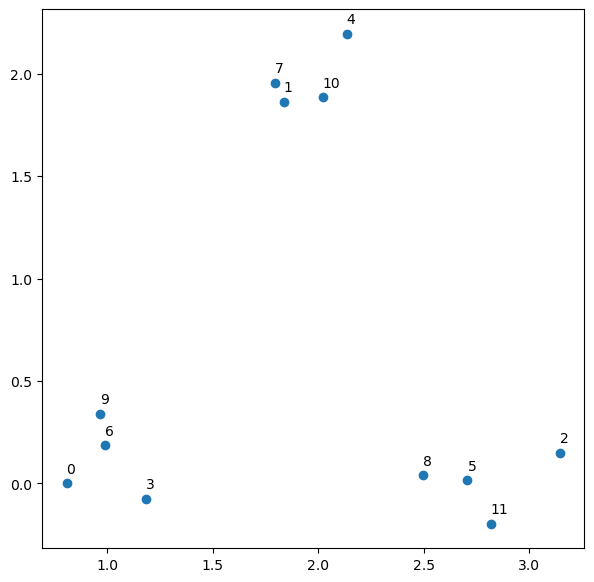

In [113]:
# Gerando um plot

fig = plt.figure(figsize=[7,7])
ax = fig.add_subplot(111)
ax.scatter(pontos.x, pontos.y)

for idx, col in pontos.iterrows():
    ax.annotate(idx, (col['x'], col['y'] + .05))

#### Gerando os *k* centróides

Vamos fazer uma definição inicial dos *k* centróides 'arbitrária'. Não se preocupe com este passo na prática, pois os algoritmos possuem métodos para gerar estes centróides para nós. Neste exercício vamos fazer uma definição para poder acompanhar a execução do algoritmo de forma visual.

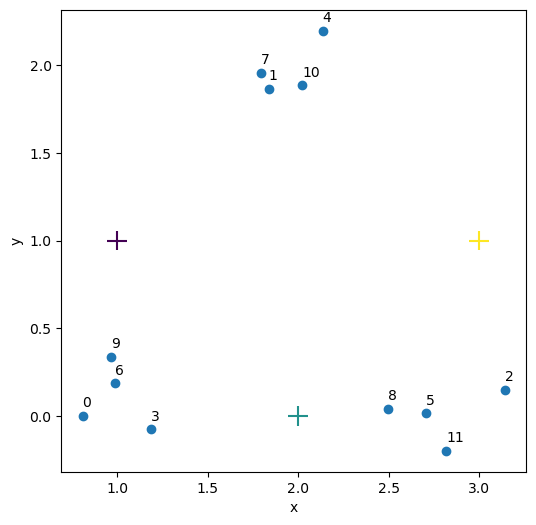

In [116]:
# Gerar os dados
np.random.seed(2360873)

# Centróides iniciais
centroides = pd.DataFrame(np.array([[1,1], [2,0], [3,1]]), columns=['x', 'y'])

# Fazer o gráfico dos pontos
fig = plt.figure(figsize=[6,6])
ax = fig.add_subplot(111)
ax.scatter(pontos.x, pontos.y)
ax.set_xlabel('x')
ax.set_ylabel('y')

# Identificar os centróides nos gráficos
ax.scatter(centroides.x, centroides.y, c=[1,2,3], marker='+', s=200, cmap='viridis')

for idx, col in pontos.iterrows():
    ax.annotate(idx, (col['x'], col['y'] + .05))

#### Classificar os pontos aos centroides mais próximos

Neste passo vamos classificar cada ponto como pertencente a um grupo conforme a distância aos centroides. O ponto pertencerá ao centróide que estiver mais próximo. Fazendo isso, vamos plotar novamente para acompanhar a execução.

In [122]:
# Calculando a distância entre os pontos e os centróides

# método .cdist --> Compute distance between each pair of the two collections of inputs
dists = distance.cdist(pontos, centroides, 'euclidean') # scipy method

#Classifica o ponto no grupo com menor distância ao respectivo ventróide
grupo = dists.argmin(1) # seleciona o menor valore em cada linha

In [134]:
# As distâncias e o grupo
dists, grupo

# Cada linha possui a distância do ponto aos diferentes centróides

(array([[1.01608669, 1.19197713, 2.40838794],
        [1.2029477 , 1.87141185, 1.44919929],
        [2.30700812, 1.15486224, 0.86158893],
        [1.09023479, 0.81824917, 2.10904025],
        [1.64891101, 2.19939226, 1.47478992],
        [1.97117276, 0.70816309, 1.02644533],
        [0.81275572, 1.02768702, 2.16851617],
        [1.24478264, 1.96772758, 1.53817209],
        [1.77752355, 0.49855645, 1.08269424],
        [0.66116068, 1.0887426 , 2.13884369],
        [1.35196928, 1.88521504, 1.3190538 ],
        [2.17649849, 0.84131891, 1.21040973]]),
 array([0, 0, 2, 1, 2, 1, 0, 0, 1, 0, 2, 1], dtype=int64))

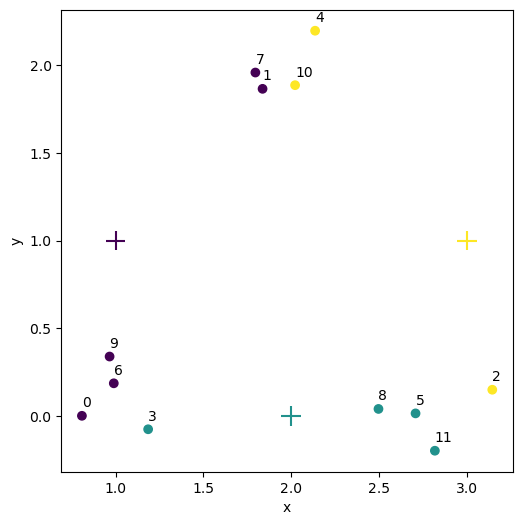

In [142]:
# Plotando novamente

fig = plt.figure(figsize=[6,6])
ax = fig.add_subplot(111)

# Plotando com as cores referentes aos centróides mais próximos (c=grupo)
ax.scatter(pontos.x, pontos.y, c=grupo)
ax.set_aspect('equal', 'box')
ax.set_xlabel('x')
ax.set_ylabel('y')

# Identificar os centróides nos gráficos
ax.scatter(centroides.x, centroides.y, c=[1,2,3], marker='+', s=200, cmap='viridis')

for idx, col in pontos.iterrows():
    ax.annotate(idx, (col['x'], col['y'] + .05))

#### Atualizar os centróides

Os centróides terão suas posições alteradas para ocupar a coordenada correspondente à média em cada eixo das coordenadas dos pontos classificados nesse centróide. Isso pode alterar uma nova classificação dos pontos aos novos grupos. Vamos plotar para acompanhar.

In [147]:
# Atualiza centróides
centroides = pontos.groupby(grupo).mean()
centroides

,x,y
0,1.279155,0.870129
1,2.301994,-0.053439
2,2.434314,1.410323


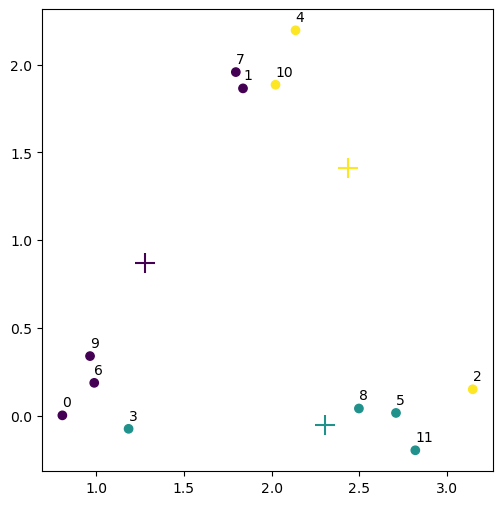

In [173]:
# O plot

fig = plt.figure(figsize=[6,6])
ax = fig.add_subplot(111)

ax.scatter(pontos.x, pontos.y, c=grupo)
ax.set_aspect('equal', 'box')

ax.scatter(centroides.x, centroides.y, c=[1,2,3], marker='+', s=200, cmap='viridis')

for val, col in pontos.iterrows():
    ax.annotate(val, (col.x, col.y + .05))

#### Atualizando novamente a classificação dos pontos

Ao 'andar' com os centróides, as classificações dos pontos se alteram. Vamos reclassificar todos os pontos e plotar para acompanhar.

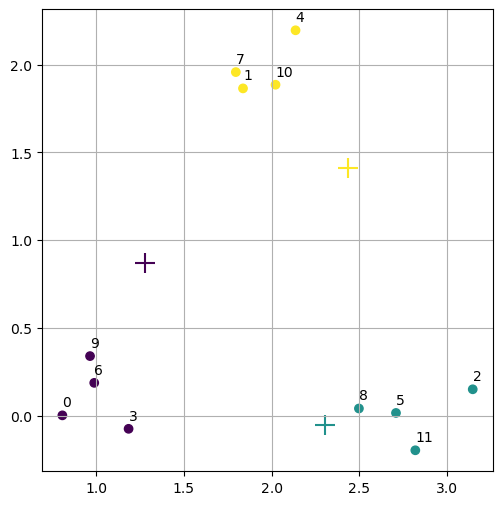

In [193]:
# Calculando as novas distâncias
dists = distance.cdist(pontos, centroides, 'euclidean')

# Atualiza o grupo
grupo = dists.argmin(1)

# Plot
fig = plt.figure(figsize=[6,6])
ax = fig.add_subplot(111)
ax.set_aspect('equal', 'box')
ax.grid()

ax.scatter(pontos.x, pontos.y, c=grupo)
ax.scatter(centroides.x, centroides.y, c=[1,2,3], marker='+', s=200, cmap='viridis')

for val, col in pontos.iterrows():
    ax.annotate(val, (col.x, col.y + .05))

#### Atualizando novamente os centróides

Vamos atualizar os centróides novamente. Veja que agora a classificação de mais nenhum ponto se altera, portanto os centróides também permanecerão os mesmos. O algoritmo encerra neste passo.

In [197]:
# Atualiza centróides
centroides = pontos.groupby(grupo).mean()
centroides

,x,y
0,0.987078,0.113715
1,2.791956,0.002835
2,1.947640,1.975415


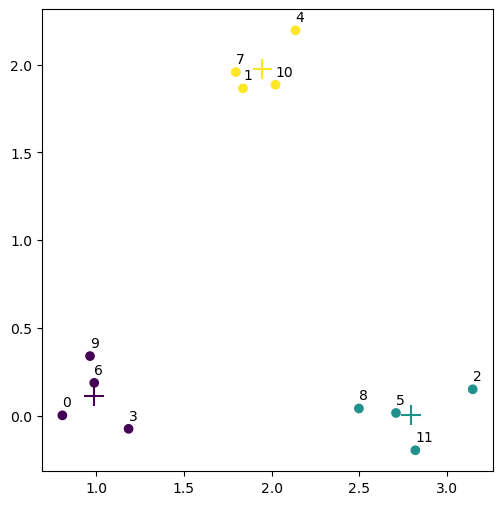

In [211]:
# Gráfico
fig = plt.figure(figsize=[6,6])
ax = fig.add_subplot(111)
ax.set_aspect('equal', 'box')
# ax.grid()

ax.scatter(pontos.x, pontos.y, c=grupo)
ax.scatter(centroides.x, centroides.y, c=[1,2,3], marker='+', s=200, cmap='viridis')

for val, col in pontos.iterrows():
    ax.annotate(val, (col.x, col.y + .05))

## 5 - Aplicação

Vamos aplicar o K-Means na based de dados de "*Human Activity Recognition using Smartphones*", disponível no [UCI](https://archive.ics.uci.edu/ml/datasets/human+activity+recognition+using+smartphones) (repositório de bases de dados para *Machine Learning* da Universidade de Irvine.

## Fluxo de projeto

Lembre-se do [CRISP-DM](https://en.wikipedia.org/wiki/Cross-industry_standard_process_for_data_mining). Ao discutir o algoritmo estamos nos concentrando em uma parte específica do fluxo de um projeto enorme, mas essa parte depende fortemente do entendimento do negócio.

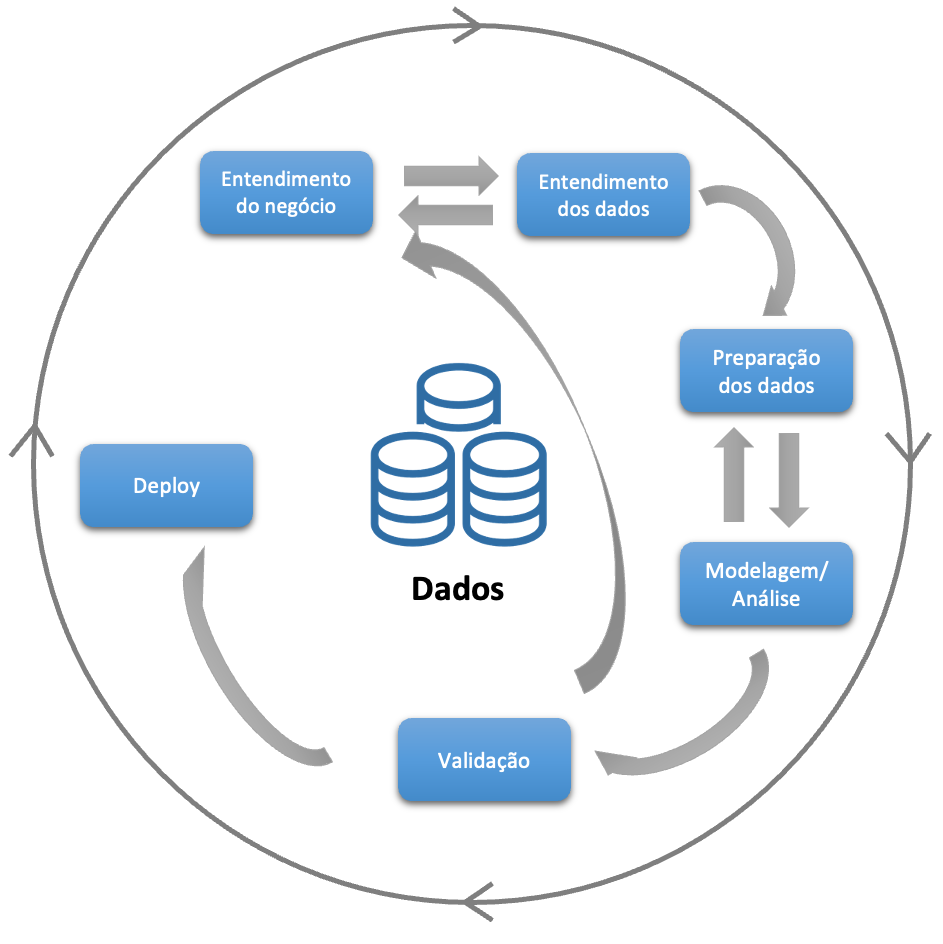
[Link fonte Fig.](https://www.preditiva.ai/blog/entenda-o-crisp-dm-suas-etapas-e-como-de-fato-gerar-valor-com-essa-metodologia)

Métodos de agrupamento trazem uma carga subjetiva bem maior que métodos de classificação como árvores de decisão e *random forest*, e o entendimento do negócio tem um papel crucial aqui. Ao decidir que variáveis entram no modelo estamos interferindo fortemente nos resultados, e essa decisão deve depender do objetivo do negócio. Por exemplo, se o objetivo é entender padrões de consumo, tipicamente variáveis biométricas ou financeiras do cliente não devem ser relevantes. Por outro lado, se estamos estudando o desempenho de atletas, talvez a prioridade seja diferente.

**O nosso objetivo** é verificar se encontramos padrões de movimentação que definam bem grupos de observações semelhantes entre si e diferentes entre si, depois vamos tentar interpretar estes grupos.

Para isso vamos fazer uma seleção de variáveis (*feature selection*) com ideias bem simples, porém usando um pouco a criatividade para estarmos conectados aos objetivos iniciais. Esteja sempre conectado ao objetivo inicial!

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [3]:
# Carregando dados

filename_features = "./input/features.txt"
filename_labels = "./input/activity_labels.txt"

filename_subtrain = "./input/train/subject_train.txt"
filename_xtrain = "./input/train/X_train.txt"
filename_ytrain = "./input/train/y_train.txt"

filename_subtest = "./input/test/subject_test.txt"
ffilename_xtest = "./input/test/X_test.txt"
filename_ytest = "./input/test/y_test.txt"

features = pd.read_csv(filename_features, header=None, names=['nome_var'], sep="#")
labels = pd.read_csv(filename_labels, sep=r'\s+', header=None, names=['cod_label', 'label'])

subject_train = pd.read_csv(filename_subtrain, header=None, names=['subject_id'])
X_train = pd.read_csv(filename_xtrain, sep=r'\s+', header=None, names=features.nome_var)
y_train = pd.read_csv(filename_ytrain, header=None, names=['cod_label'])

subject_test = pd.read_csv(filename_subtest, header=None, names=['subject_id'])
X_test = pd.read_csv(ffilename_xtest, sep=r'\s+', header=None, names=features.nome_var)
y_test = pd.read_csv(filename_ytest, header=None, names=['cod_label'])

In [4]:
# Substituindo os labels no dados y_train
y_train_cat = pd.Categorical.from_codes(codes=(y_train-1).values.flatten(), categories=labels.label)
y_train_cat.value_counts()

WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
SITTING               1286
STANDING              1374
LAYING                1407
Name: count, dtype: int64

In [19]:
y_train_cat

['STANDING', 'STANDING', 'STANDING', 'STANDING', 'STANDING', ..., 'WALKING_UPSTAIRS', 'WALKING_UPSTAIRS', 'WALKING_UPSTAIRS', 'WALKING_UPSTAIRS', 'WALKING_UPSTAIRS']
Length: 7352
Categories (6, object): ['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS', 'SITTING', 'STANDING', 'LAYING']

#### Tratamento das variáveis

A escala das variáveis pode ter um impacto bastante relevante no resultado de um agrupamento, o que pode ter um efeito arbitrário, sem controle e levar a resultados ruins. Vamos padronizar as variáveis para que fiquem com a **média 0 e variância 1**, de modo a mitigar esse efeito.

Lembrando que a saída do `StandardScaler` é um array do Numpy. Vamos convertê-lo para *Data Frame*.


In [31]:
# Padronizando 

X_pad = StandardScaler().fit_transform(X_train)
X_pad = pd.DataFrame(X_pad, columns = X_train.columns)

# Adicionado a variável "reposta" aos dados
X_pad['y'] = y_train_cat

In [35]:
X_pad.head()

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)",y
0,0.200642,-0.063683,-0.419628,-0.868814,-0.939441,-0.737529,-0.859817,-0.939019,-0.766437,-0.856036,...,0.025960,-0.276399,-0.360603,0.062940,-0.778427,-0.026080,-0.687219,0.407946,-0.007568,STANDING
1,0.055948,0.031486,-0.253908,-0.875426,-0.923902,-0.849304,-0.868531,-0.921998,-0.848928,-0.871359,...,-0.897357,-0.767990,0.133011,-0.021461,-1.218805,1.484470,-0.694138,0.409117,0.007875,STANDING
2,0.073515,-0.043416,-0.076295,-0.869039,-0.907760,-0.893785,-0.863137,-0.898854,-0.896701,-0.863323,...,-0.260878,-0.438316,-0.377840,0.391976,0.151207,1.704201,-0.702239,0.410288,0.026502,STANDING
3,0.066696,-0.208422,-0.249712,-0.870626,-0.940022,-0.921805,-0.864503,-0.938124,-0.925279,-0.863323,...,0.591045,0.463155,-0.135025,-0.033637,1.037851,-1.003019,-0.701684,0.414650,0.031714,STANDING
4,0.030469,0.027587,-0.109848,-0.875188,-0.934878,-0.921343,-0.867384,-0.931789,-0.928028,-0.870260,...,-0.138515,-0.240313,0.340406,0.268486,1.125918,-1.276282,-0.700152,0.425463,0.045225,STANDING


#### Seleção de variáveis

Lembrando do nosso objetivo: capturar padrões de movimento nas variáveis de variação do acelerômetro e giroscópio do celular, tipificando grupos de variação semelhantes dentro, e diferentes entre grupos.

Tendo isso em mente, a ideia é selecionar variáveis que representem as atividades que as pessoas estão fazendo, uma para cada atividade. Então vamos usar a criatividade (rimou...).

Vamos calcular a média de cada variável dentro de cada um dos grupos. Lembrando que a média geral das variáveis padronizadas é zero, um valor descolado do zero deve indicar que a variável representa aquele comportamento. Então vamos selecionar a variável com o maior valor absoluto da mediana para cada comportamento.

In [44]:
mediana_grupo = X_pad.groupby('y', observed=False).median()
mediana_grupo

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
y,,,,,,,,,,,,,,,,,,,,,
WALKING,0.001339,-0.004197,-0.022651,0.624258,0.943942,0.783498,0.629471,0.947902,0.778652,0.668609,...,-0.038043,0.548251,0.375385,0.071887,-0.084158,0.018578,-0.019639,-0.537485,0.570071,0.368843
WALKING_UPSTAIRS,-0.111342,-0.129993,-0.079354,0.826692,0.979932,0.979584,0.796929,1.010035,1.036648,0.788137,...,-0.136773,-0.273354,-0.402196,0.096611,0.092363,-1.168191,0.140391,-0.280772,0.786554,0.541494
WALKING_DOWNSTAIRS,0.148981,-0.000460,0.001794,1.667572,1.138867,0.877696,1.655572,1.093075,0.858755,1.739815,...,-0.081643,-0.067258,-0.289348,-0.108722,-0.159323,1.205680,-0.202423,-0.575288,0.485868,0.353224
SITTING,0.040108,0.030341,0.017935,-0.864828,-0.931991,-0.887878,-0.858224,-0.931200,-0.892588,-0.860296,...,0.314368,-0.410291,-0.505962,0.004821,0.026693,0.000788,-0.024322,-0.486927,-0.126636,-0.219827
STANDING,0.042968,0.014663,0.006529,-0.866348,-0.906935,-0.881136,-0.859298,-0.906065,-0.886009,-0.860320,...,0.012261,-0.284633,-0.398046,-0.008891,0.019477,-0.054046,0.048314,-0.589258,0.509357,0.277240
LAYING,0.034988,0.008128,0.018309,-0.840948,-0.929483,-0.900528,-0.834799,-0.930004,-0.906778,-0.842210,...,0.260927,-0.315508,-0.422225,-0.000313,0.042262,0.023174,0.109880,1.951173,-1.773325,-1.585464


Uma vez que os dados foram padronizados, quanto mais os valores acima estiverem deslocados do zero mais eles estarão indicando a execução de determinada atividade pelo indivíduo.

Agora vamos selecionar as colunas, pegando para cada linha o nome da coluna com valor máximo

In [53]:
colunas = mediana_grupo.abs().idxmax(axis=1).values
colunas

# idxmax(axis=1) --> retorna o nome da coluna

array(['349 fBodyAccJerk-std()-Y', '370 fBodyAccJerk-maxInds-X',
       '509 fBodyAccMag-energy()', '78 tGravityAcc-correlation()-X,Y',
       '297 fBodyAcc-skewness()-X', '57 tGravityAcc-energy()-X'],
      dtype=object)

In [55]:
mediana_grupo.abs().idxmax(axis=1)

y
WALKING                       349 fBodyAccJerk-std()-Y
WALKING_UPSTAIRS            370 fBodyAccJerk-maxInds-X
WALKING_DOWNSTAIRS            509 fBodyAccMag-energy()
SITTING               78 tGravityAcc-correlation()-X,Y
STANDING                     297 fBodyAcc-skewness()-X
LAYING                       57 tGravityAcc-energy()-X
dtype: object

In [51]:
mediana_grupo[colunas]

,349 fBodyAccJerk-std()-Y,370 fBodyAccJerk-maxInds-X,509 fBodyAccMag-energy(),"78 tGravityAcc-correlation()-X,Y",297 fBodyAcc-skewness()-X,57 tGravityAcc-energy()-X
y,,,,,,
WALKING,1.202232,-0.054779,0.173209,0.126327,-0.032826,0.587410
WALKING_UPSTAIRS,0.531527,-1.279263,0.438330,0.656643,0.654751,0.394938
WALKING_DOWNSTAIRS,1.166609,-1.279263,1.887126,0.321926,0.370770,0.544520
SITTING,-0.856693,0.679912,-0.711657,-1.284109,-0.863811,0.523054
STANDING,-0.848196,0.679912,-0.711024,0.742047,-1.052473,0.625828
LAYING,-0.859069,0.435015,-0.711078,0.487033,0.275065,-2.015754


Vamos criar uma lista com o nome de todas as variáveis mais o rótulo da atividade para indicar no gráfico

In [60]:
colunas2 = list(colunas) + ['y']
colunas2

['349 fBodyAccJerk-std()-Y',
 '370 fBodyAccJerk-maxInds-X',
 '509 fBodyAccMag-energy()',
 '78 tGravityAcc-correlation()-X,Y',
 '297 fBodyAcc-skewness()-X',
 '57 tGravityAcc-energy()-X',
 'y']

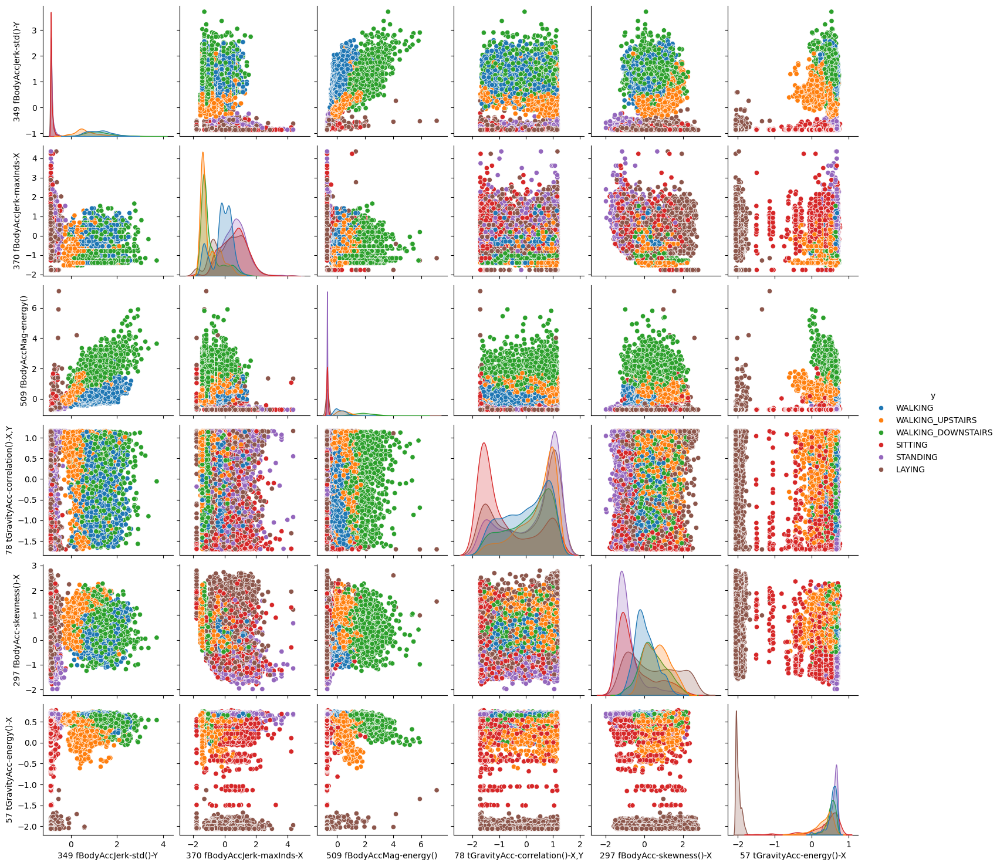

In [64]:
# Avando a descritiva das variáveis

sns.pairplot(X_pad[colunas2], hue='y')
plt.savefig('./output/1-HAR_pad.png', dpi=200)

#### Aplicando o K-means

Vamos aplicar o k-means solicitando 6 grupos (número de atividades), indicando as 6 variáveis que selecionamos.

In [71]:
cluster = KMeans(n_clusters=6)
cluster.fit_predict(X_pad[colunas])

array([4, 1, 1, ..., 5, 5, 0])

In [75]:
# Grupos aos quais as pessoas pertencem
cluster.labels_

array([4, 1, 1, ..., 5, 5, 0])

In [81]:
X_pad['grupos'] = pd.Categorical(cluster.labels_)
colunas3 = list(colunas) + ['grupos']

colunas3

['349 fBodyAccJerk-std()-Y',
 '370 fBodyAccJerk-maxInds-X',
 '509 fBodyAccMag-energy()',
 '78 tGravityAcc-correlation()-X,Y',
 '297 fBodyAcc-skewness()-X',
 '57 tGravityAcc-energy()-X',
 'grupos']

#### Descrevendo os grupos

Para descrever os grupos podemos utilizar todos os recursos de análise descritiva e visualização de dados que conhecemos. Vamos fazer um ```pairplot``` com opções diferentes de ```hue```, uma tabela cruzada e boxplots. Em um projeto real, tipicamente essa análise se estende tanto quanto necessário, podendo inclusive se ter um *dashboard* interativo da análise.

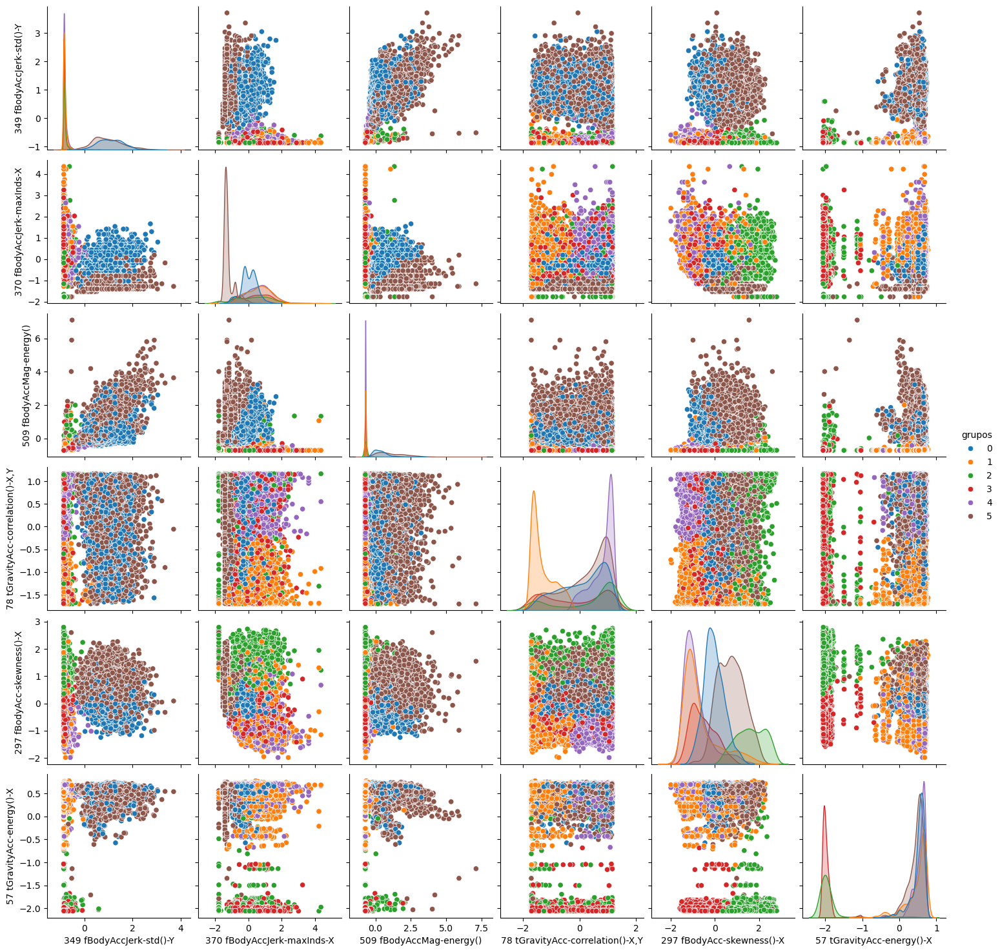

In [84]:
sns.pairplot(X_pad[colunas3], hue='grupos')
plt.savefig('./output/2-HAR_pad.png', dpi=200)

In [86]:
# Tabela cruzada do grupo com a atividade real
pd.crosstab(X_pad['y'], X_pad['grupos'])

grupos,0,1,2,3,4,5
y,,,,,,
WALKING,1031,13,0,0,3,179
WALKING_UPSTAIRS,287,1,0,0,3,782
WALKING_DOWNSTAIRS,139,0,0,0,0,847
SITTING,0,859,47,21,351,8
STANDING,0,400,14,0,953,7
LAYING,0,0,628,772,0,7


Como pode-se notar, parecem haver grupos que são redundantes, ou seja, apresentam valores correspondentes a mais de uma categoria.

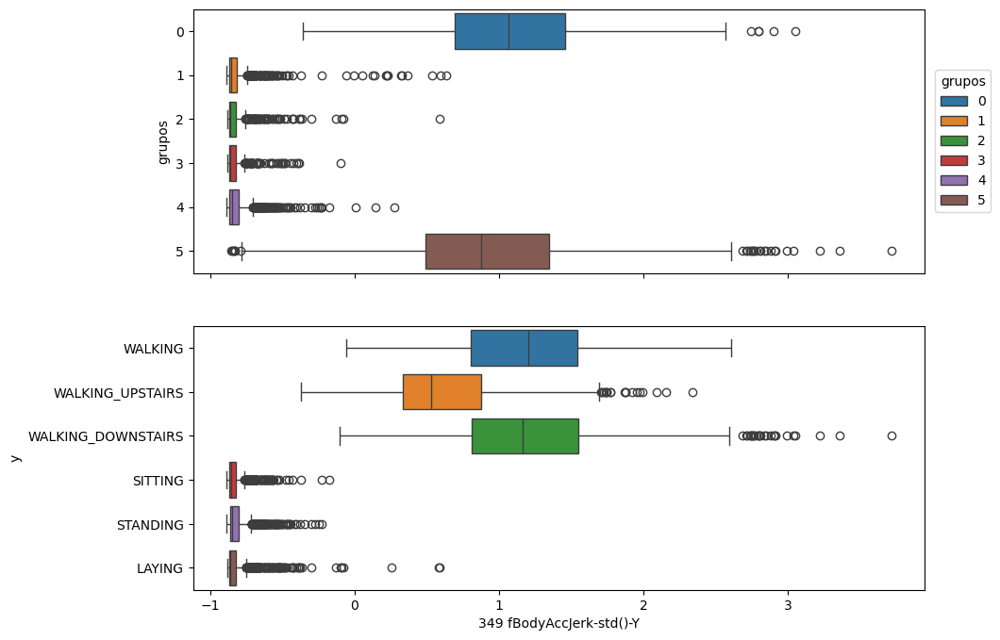

In [171]:
def dataviz_grupos(varx):
    fig, ax = plt.subplots(2,1, sharex=True, figsize=[10,8])

    ax1 = sns.boxplot(ax=ax[0], data = X_pad, y='grupos', x=varx, hue='grupos')
    ax1.legend(loc='right', bbox_to_anchor=[1.1,.5], ncol=1, title='grupos')
    
    ax2 = sns.boxplot(ax=ax[1], data = X_pad, y='y', x=varx, hue='y')
    
# Aplicando 
dataviz_grupos(colunas[0])

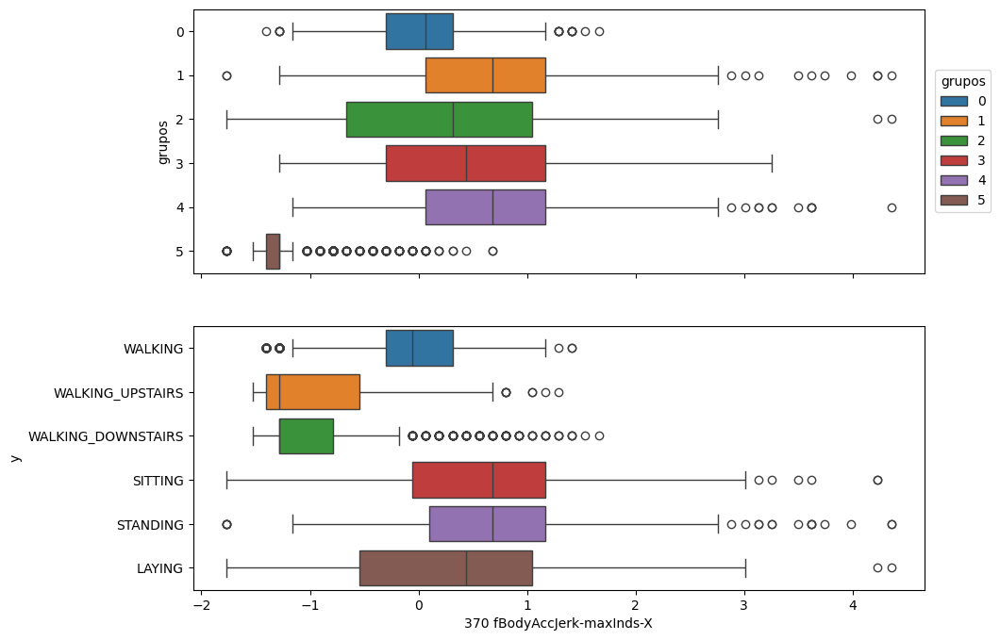

In [181]:
dataviz_grupos(colunas[1])

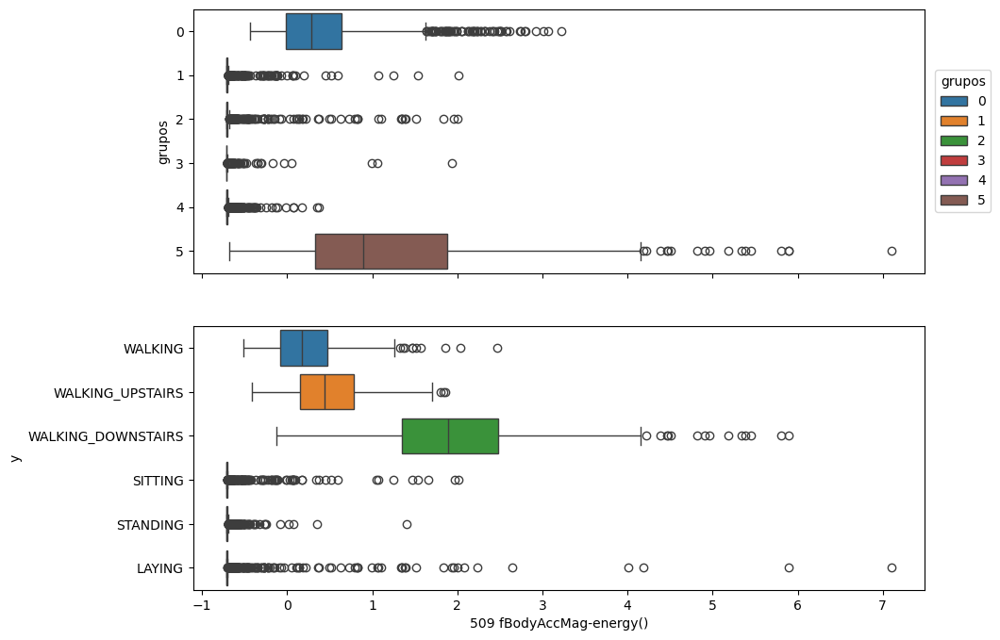

In [173]:
dataviz_grupos(colunas[2])

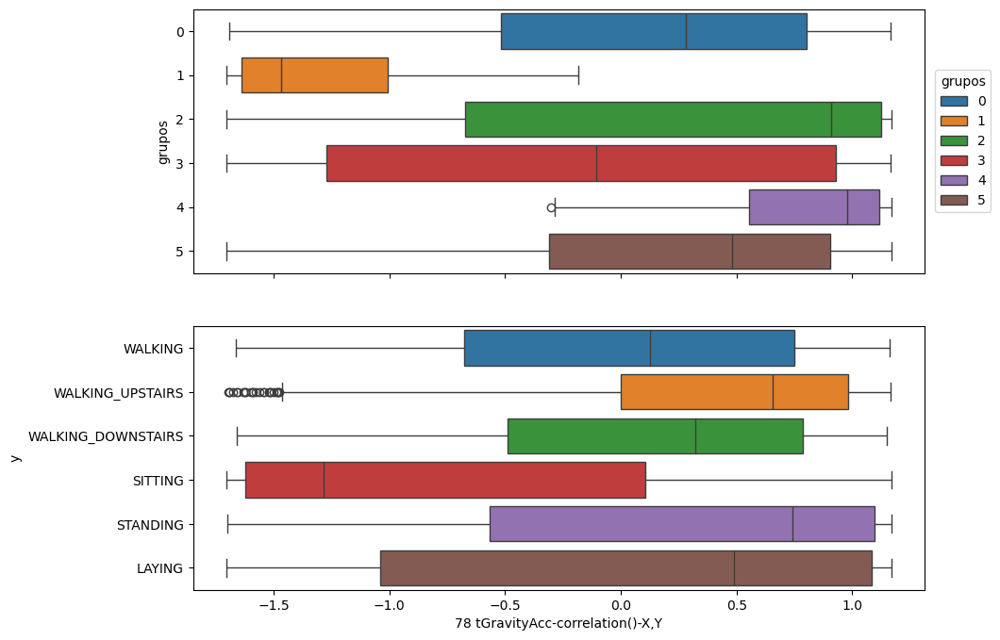

In [175]:
dataviz_grupos(colunas[3])

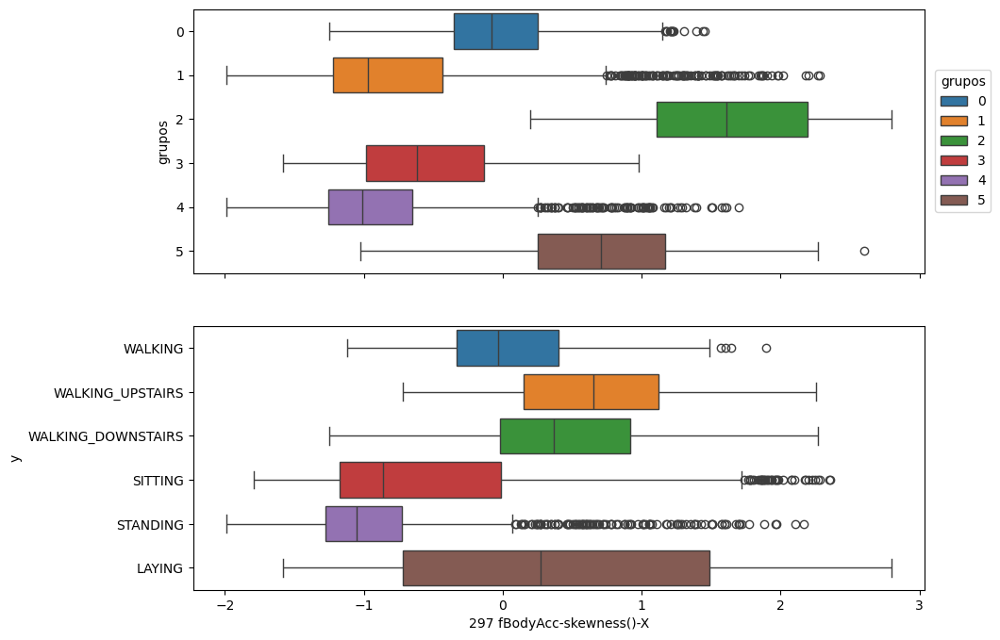

In [177]:
dataviz_grupos(colunas[4])

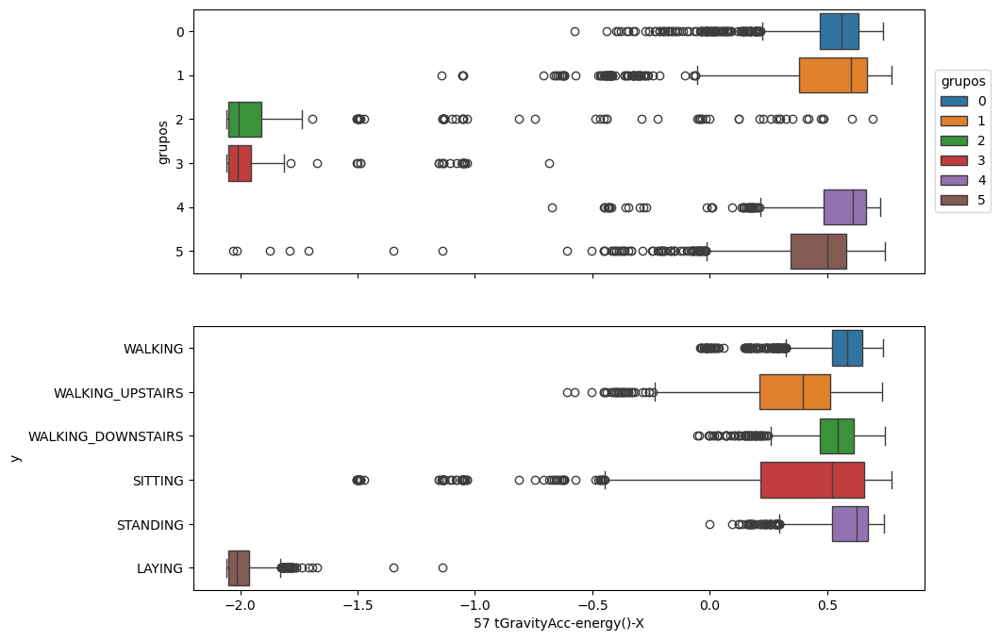

In [179]:
dataviz_grupos(colunas[5])

#### Outra seleção de variáveis

O código abaixo tem outra abordagem para a seleção de variáveis: Ele faz, para cada variável, para cada grupo, um *teste-t* (teste de diferença de médias) que testa a significância da diferença da média do grupo contra as demais observações.

A ideia é selecionar variáveis que discriminam melhor cada uma das atividades, e portanto *representem* melhor a atividade.


In [208]:
from scipy.stats import ttest_ind

ttest_ind(X_pad.loc[X_pad.y.cat.codes ==0, colunas[0]], # Comparando a média desses valores
         X_pad.loc[X_pad.y.cat.codes != 0, colunas[0]]) # com a média desses

TtestResult(statistic=54.728079720108184, pvalue=0.0, df=7350.0)

In [210]:
ttest_ind(X_pad.loc[X_pad.y.cat.codes ==0, colunas[0]], # Comparando a média desses valores
         X_pad.loc[X_pad.y.cat.codes != 0, colunas[0]])[0]

54.728079720108184

In [192]:
# Preparando um df para atribuir os novos valores

estatistica_t = mediana_grupo.copy()
estatistica_t.loc[:,:] = 0
estatistica_t

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
y,,,,,,,,,,,,,,,,,,,,,
WALKING,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WALKING_UPSTAIRS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WALKING_DOWNSTAIRS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SITTING,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
STANDING,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
LAYING,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [220]:
for var in [estatistica_t.columns]:
    for grupo in X_pad.y.unique():
        estatistica_t.loc[grupo, var] = ttest_ind(X_pad.loc[X_pad.y == grupo, var],
                                                 X_pad.loc[X_pad.y != grupo, var])[0]

In [221]:
estatistica_t

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
y,,,,,,,,,,,,,,,,,,,,,
WALKING,0.967439,-0.067936,0.174004,26.166673,41.620604,35.551268,26.528046,41.417805,35.789081,26.816027,...,-1.203112,30.946242,30.364865,1.408627,-1.206629,-0.350029,-0.734512,-20.625129,21.517422,17.399861
WALKING_UPSTAIRS,-6.352454,-7.806395,-7.084781,32.462161,39.670609,44.236345,31.179186,41.266271,45.984088,31.764591,...,-4.889063,-6.141571,-6.361407,2.225540,0.268371,-9.717742,3.767270,-10.022811,28.052085,24.414636
WALKING_DOWNSTAIRS,6.589483,1.095813,1.955108,74.054083,44.669770,38.563031,73.933657,42.671130,36.818891,74.988379,...,-3.494674,-1.671433,-4.451472,-4.755442,-1.807143,9.828818,-4.562789,-19.522339,16.240613,14.150266
SITTING,-0.583854,5.381928,1.784995,-36.079990,-36.265344,-33.920043,-35.787226,-36.078076,-33.905698,-36.014539,...,7.572307,-9.759974,-8.057721,0.407756,-0.002364,0.518274,-1.816552,-15.785481,-8.326475,-5.617955
STANDING,2.812914,1.583936,1.314819,-38.077934,-38.027215,-35.938748,-37.869016,-37.971507,-35.956688,-37.401049,...,-5.089438,-5.514668,-4.428332,-0.236208,0.763755,-0.452876,1.614041,-23.683725,21.318364,14.583891
LAYING,-3.146733,-0.664169,1.452766,-35.638163,-38.876141,-36.471427,-35.239167,-38.714397,-36.603225,-36.833597,...,6.312590,-5.831511,-5.458725,0.622161,1.713324,0.486972,1.420119,282.574619,-121.368245,-79.159981


In [226]:
# Façamos novamente o processo, agora considerando os valores da estistica t

# Pegando os valores máximos de cada linha

colunas_tt = estatistica_t.abs().idxmax(axis=1).values
colunas_tt

array(['355 fBodyAccJerk-max()-Y', '277 fBodyAcc-max()-Z',
       '509 fBodyAccMag-energy()', '183 tBodyGyroJerk-entropy()-X',
       '26 tBodyAcc-arCoeff()-X,1', '41 tGravityAcc-mean()-X'],
      dtype=object)

In [230]:
# Em quais colunas estão os maiores valores das linhas
estatistica_t.abs().idxmax(axis=1)

y
WALKING                    355 fBodyAccJerk-max()-Y
WALKING_UPSTAIRS               277 fBodyAcc-max()-Z
WALKING_DOWNSTAIRS         509 fBodyAccMag-energy()
SITTING               183 tBodyGyroJerk-entropy()-X
STANDING                  26 tBodyAcc-arCoeff()-X,1
LAYING                      41 tGravityAcc-mean()-X
dtype: object

##### Aplicando novamente o K-means

In [237]:
cluster = KMeans(n_clusters=6)
# Fittando com os novos dados
cluster.fit_predict(X_pad[colunas_tt])

# Adicionando os labels ao dataframe
X_pad['grupo2'] = pd.Categorical(cluster.labels_)

X_pad.head(2)

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)",y,grupos,grupo2
0,0.200642,-0.063683,-0.419628,-0.868814,-0.939441,-0.737529,-0.859817,-0.939019,-0.766437,-0.856036,...,-0.360603,0.062940,-0.778427,-0.02608,-0.687219,0.407946,-0.007568,STANDING,4,0
1,0.055948,0.031486,-0.253908,-0.875426,-0.923902,-0.849304,-0.868531,-0.921998,-0.848928,-0.871359,...,0.133011,-0.021461,-1.218805,1.48447,-0.694138,0.409117,0.007875,STANDING,1,0


In [241]:
colunas4 = list(colunas) + ['grupo2']
colunas4

['349 fBodyAccJerk-std()-Y',
 '370 fBodyAccJerk-maxInds-X',
 '509 fBodyAccMag-energy()',
 '78 tGravityAcc-correlation()-X,Y',
 '297 fBodyAcc-skewness()-X',
 '57 tGravityAcc-energy()-X',
 'grupo2']

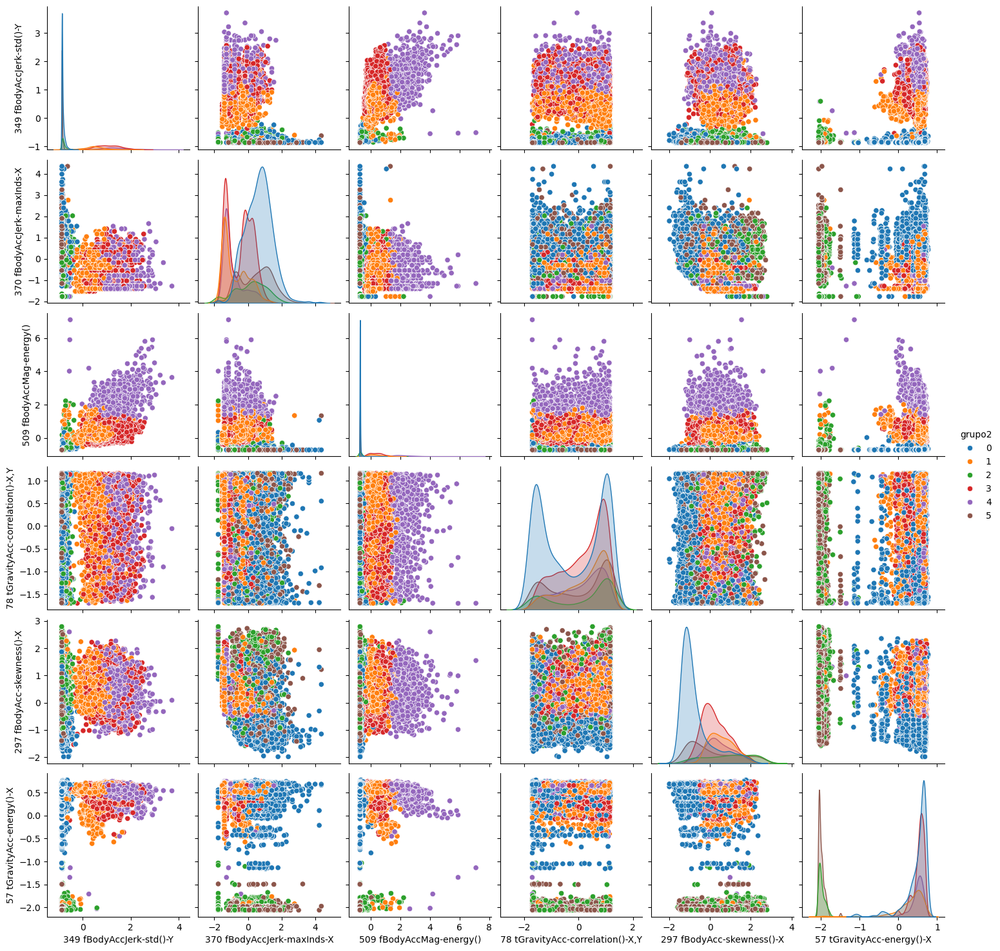

In [245]:
# Gerando um pairplot

sns.pairplot(X_pad[colunas4], hue='grupo2')
plt.savefig('./output/3-HAR_pad_grupo2.png', dpi=200)

In [247]:
# Gerando um crosstable

pd.crosstab(X_pad.y, X_pad.grupo2)

grupo2,0,1,2,3,4,5
y,,,,,,
WALKING,0,216,0,992,18,0
WALKING_UPSTAIRS,0,601,0,456,16,0
WALKING_DOWNSTAIRS,0,35,0,234,717,0
SITTING,1242,22,7,3,0,12
STANDING,1359,9,0,6,0,0
LAYING,0,13,509,0,5,880


In [285]:
# Gerando uma análise
def dataviz_grupo2(varx):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=[10,8])

    ax1 = sns.boxplot(ax = ax[0], data=X_pad, x=varx, y='grupo2', hue='grupo2')
    ax1.legend(loc='right', bbox_to_anchor=[1.1,.5], ncol=1, title='grupo2')

    ax2 = sns.boxplot(ax = ax[1], data=X_pad, x=varx, y='y', hue='y')
    plt.show()

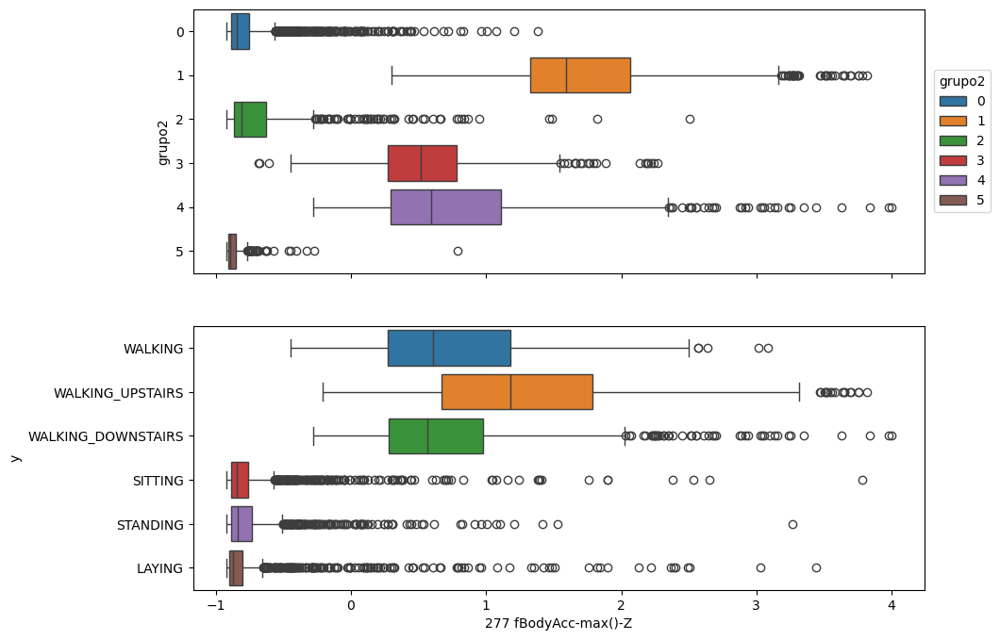

In [287]:
dataviz_grupo2(colunas_tt[1])

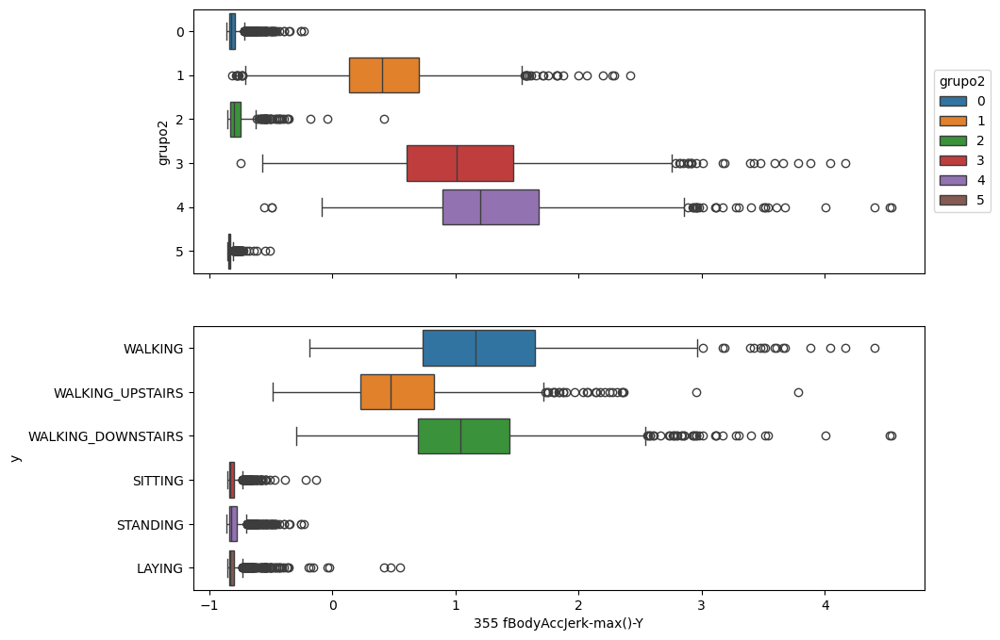

In [289]:
dataviz_grupo2(colunas_tt[0])

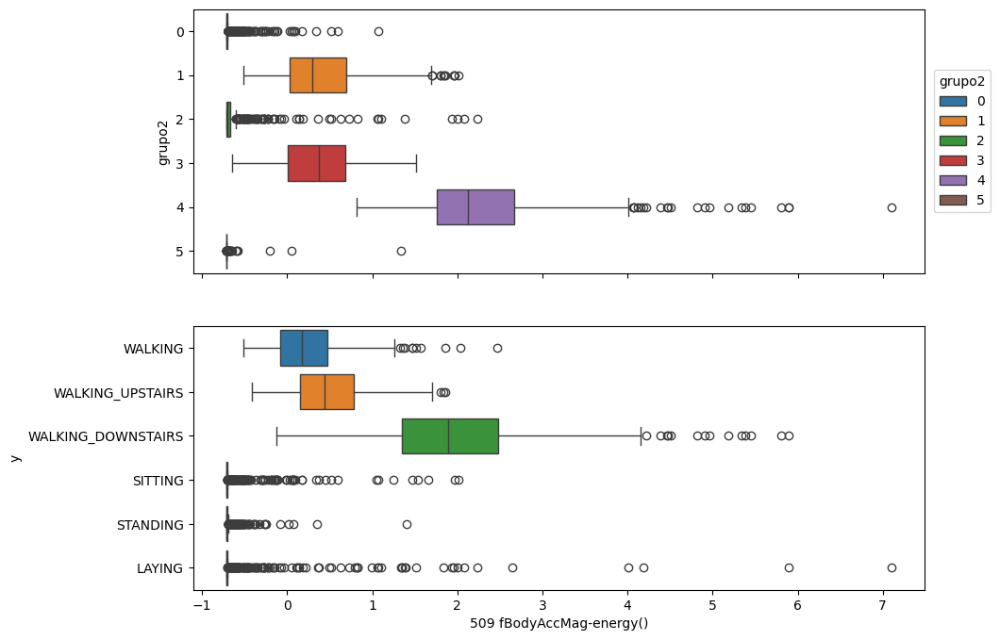

In [290]:
dataviz_grupo2(colunas_tt[2])

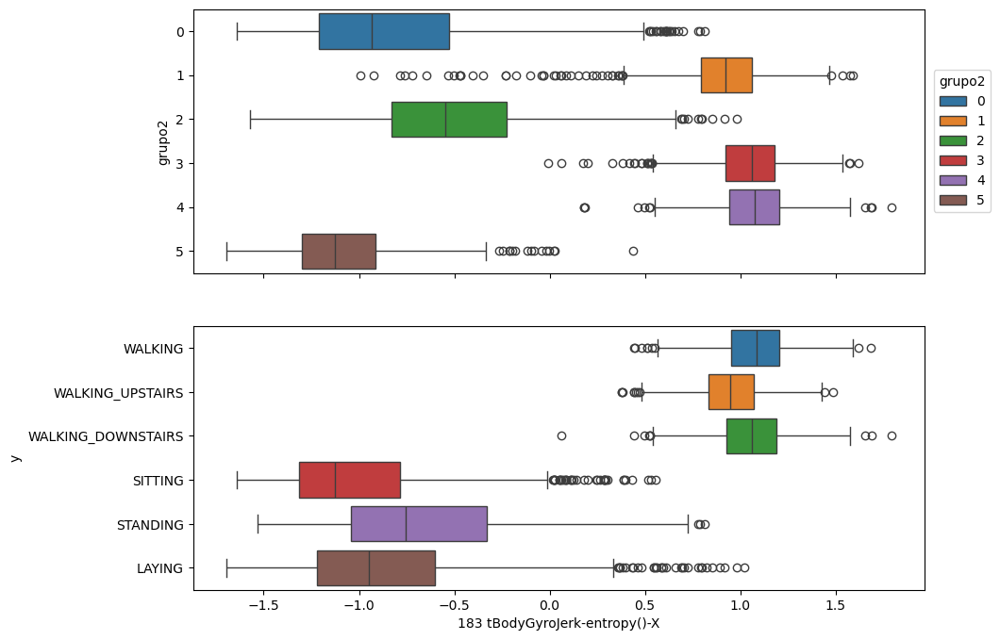

In [291]:
dataviz_grupo2(colunas_tt[3])

## 6 - Análise de clusters

#### Quantos clusters 

Seguindo a nossa jornada nos algoritmos não supervisionados, estamos tendo contato com a quantidade de subjetividade que temos nessa temática de análise de agrupamentos. Lembre-se sempre que o objetivo do projeto deve direcionar as decisões ao longo do projeto.

Para abrir esta seção, gostaria de frisar uma frase em letras garrafais, que você deve considerar ao fazer uma análise de clusters:

**Em geral não há solução correta**. Além disso, lembre-se da frase de Box: "**Todo modelo está errado, mas alguns são úteis**". Concentre-se mais em encontrar ou melhorar a utilidade do seu agrupamento que em encontrar um "agrupamento correto" pois em geral isso não existe. Se existir, estaríamos em um método supervisionado.

Vamos nos ater agora a esta pergunta importante, ainda subjetiva, mas que ao menos possui respaldo quantitativo para auxiliar na decisão, que é **qual o número de clusters que eu devo usar?**.

Parâmetros a se considerar:

- **Objetivo de negócio**: Como sempre, o objetivo de negócio, ou o objetivo do projeto deve falar mais alto. Se a priori é factível de se trabalhar com no máximo 10 clusters, não adianta considerarmos soluções com centenas de grupos. Muitas vezes já se tem um número de clusters na cabeça, faz sentido investigar a 'melhor solução' nesse entorno.

- **Métricas quantitativas**: Vamos ver aqui algumas métricas quantitativas que nos ajudam a responder a esta pergunta. Mas embora alguns autores referenciem a técnica como "encontrar o número *ótimo* de grupos", creio que vale lembrar que há diversas métricas que clamam atingir o mesmo objetivo e que chegam a soluções diferentes. Vale também lembrar a quantidade de subjetividade que temos já na escolha das variáveis, que com decisões ligeiramente diferentes já chegamos a resultados diferentes. Dito isto, olhe as métricas como 'critérios' ou como 'referências' muito mais que 'verdades' ou 'pontos ótimos' que devem ser 'encontrados'.

- **Descrição dos grupos**: Ao descrever os grupos, eles devem fazer sentido e ser úteis com relação ao objetivo do projeto. Por exemplo, uma segmentação de clientes em um streamming de música pode ser útil para sugerir ao cliente as novidades de maior sucesso dentro do estilo que ele gosta.

In [242]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.metrics import silhouette_score # Método da silhueta
from tqdm import tqdm # para obtermos barras de progresso no s "for"

In [2]:
# Carregando dados

filename_features = "./input/features.txt"
filename_labels = "./input/activity_labels.txt"

filename_subtrain = "./input/train/subject_train.txt"
filename_xtrain = "./input/train/X_train.txt"
filename_ytrain = "./input/train/y_train.txt"

filename_subtest = "./input/test/subject_test.txt"
ffilename_xtest = "./input/test/X_test.txt"
filename_ytest = "./input/test/y_test.txt"

features = pd.read_csv(filename_features, header=None, names=['nome_var'], sep="#")
labels = pd.read_csv(filename_labels, sep=r'\s+', header=None, names=['cod_label', 'label'])

subject_train = pd.read_csv(filename_subtrain, header=None, names=['subject_id'])
X_train = pd.read_csv(filename_xtrain, sep=r'\s+', header=None, names=features.nome_var)
y_train = pd.read_csv(filename_ytrain, header=None, names=['cod_label'])

subject_test = pd.read_csv(filename_subtest, header=None, names=['subject_id'])
X_test = pd.read_csv(ffilename_xtest, sep=r'\s+', header=None, names=features.nome_var)
y_test = pd.read_csv(filename_ytest, header=None, names=['cod_label'])

In [3]:
# Categorical 

y_train_cat = pd.Categorical.from_codes(codes=(y_train-1).values.flatten(), categories=labels.label)
y_train_cat.value_counts()

WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
SITTING               1286
STANDING              1374
LAYING                1407
Name: count, dtype: int64

In [4]:
# Padronizando os dados

X_pad = pd.DataFrame(StandardScaler().fit_transform(X_train), columns = X_train.columns)
X_pad['y'] = y_train_cat

In [5]:
X_pad.head()

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)",y
0,0.200642,-0.063683,-0.419628,-0.868814,-0.939441,-0.737529,-0.859817,-0.939019,-0.766437,-0.856036,...,0.025960,-0.276399,-0.360603,0.062940,-0.778427,-0.026080,-0.687219,0.407946,-0.007568,STANDING
1,0.055948,0.031486,-0.253908,-0.875426,-0.923902,-0.849304,-0.868531,-0.921998,-0.848928,-0.871359,...,-0.897357,-0.767990,0.133011,-0.021461,-1.218805,1.484470,-0.694138,0.409117,0.007875,STANDING
2,0.073515,-0.043416,-0.076295,-0.869039,-0.907760,-0.893785,-0.863137,-0.898854,-0.896701,-0.863323,...,-0.260878,-0.438316,-0.377840,0.391976,0.151207,1.704201,-0.702239,0.410288,0.026502,STANDING
3,0.066696,-0.208422,-0.249712,-0.870626,-0.940022,-0.921805,-0.864503,-0.938124,-0.925279,-0.863323,...,0.591045,0.463155,-0.135025,-0.033637,1.037851,-1.003019,-0.701684,0.414650,0.031714,STANDING
4,0.030469,0.027587,-0.109848,-0.875188,-0.934878,-0.921343,-0.867384,-0.931789,-0.928028,-0.870260,...,-0.138515,-0.240313,0.340406,0.268486,1.125918,-1.276282,-0.700152,0.425463,0.045225,STANDING


Utilizando as variáveis da seção anterior.

In [7]:
variables = ['355 fBodyAccJerk-max()-Y', '277 fBodyAcc-max()-Z',
       '509 fBodyAccMag-energy()', '183 tBodyGyroJerk-entropy()-X',
       '26 tBodyAcc-arCoeff()-X,1', '41 tGravityAcc-mean()-X']

Vamos calcular uma métrica de qualidade desse agrupamento.

#### Método do cotovelo

O primeiro método, também referenciado como método do 'cotovelo' (*elbow method*) é bastante popular, provavelmente por ser bastante simples e intuitivo.

Ele considera uma métrica de 'qualidade' do agrupamento como a **soma de quadrados das distâncias (SSD)** de cada observação ao seu respectivo centróide. Observe que essa métrica *sempre* reduz conforme aumentamos o número de clusters - até ser zero quando o número de clusters é o número de observações.

O método leva o nome de método do cotovelo pois consiste em rodar diversos *k-means* com quantidades de grupos diferentes, e calcular o respectivo SSD. Plotamos o SSD versus a quantidade de grupos, normalmente observamos uma queda mais 'brusca' no início da curva, sendo mais e mais suave conforme aumenta o K. A ideia é procurar um 'cotovelo' na curva, indicando que a redução do SSD passa a ser muito pequena conforme se aumenta o K, esse será o número de agrupamentos indicado pela técnica.

Sim, esse método é subjetivo, e sim, você pode fazer uma leitura diferente da minha. Mas como eu falei, é mais uma 'indicação'. 

In [50]:
# Definindo uma lista da soma dos quadrados da distância (do centróide)
SQD = []
# Lista do número de clusters
K = range(1,15)
for k in tqdm(K):
    km = KMeans(n_clusters=k)
    km.fit(X_pad[variables])
    SQD.append(km.inertia_) # O atributo inertia retorna a soma dos quadrados das distâncias

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:00<00:00, 66.91it/s]


In [51]:
SQD

[44111.99999999999,
 17217.98976082301,
 11388.035329353106,
 10519.435912528577,
 7972.044741973099,
 7130.620644886358,
 7409.0301393616355,
 6077.54207313432,
 5920.098409748204,
 5407.669785145968,
 5120.623478503202,
 4910.679697370114,
 4849.533255195421,
 4573.379059216188]

,num_clusters,SQD
0,1,44112.000000
1,2,17217.989761
2,3,11388.035329
3,4,10519.435913
4,5,7972.044742
5,6,7130.620645
6,7,7409.030139
7,8,6077.542073
8,9,5920.098410
9,10,5407.669785


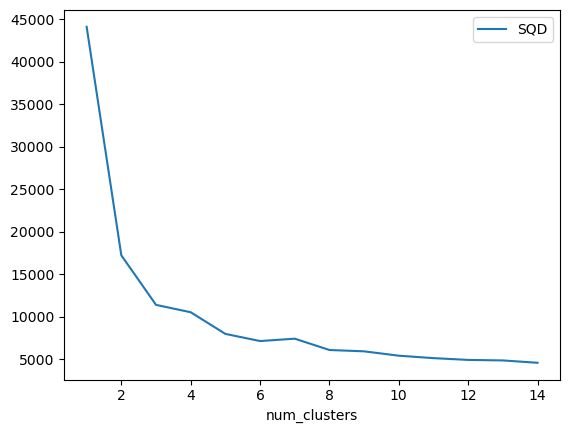

In [54]:
df = pd.DataFrame({'num_clusters': list(range(1, len(SQD)+1)), 'SQD': SQD})

df.plot(x='num_clusters', y='SQD');

df

#### Coeficiente de *Silhueta*

O coeficiente de Silhueta (*silhouette coefficient*, traduzido livremente) é uma métrica que visa ser um pouco mais objetiva, quanto maior 'melhor', de modo que a indicação seria o número de clusters que fornece a maior silueta.

O coeficiente *Silhouette* pode ser calculado com esta fórmula:

$$ S(i) = \frac{b(i) - a(i)}{max\{a(i), b(i)\}} $$

em que:

- a(i) é a média das distâncias do ponto i a todos os pontos do grupo mais próximo exceto o seu próprio
- b(i) é a média das distâncias do ponto i a todos os demais pontos do seu grupo

Vamos utilizar a função ```silhouette_score``` para calcular a silhueta média dos grupos. Esse indicador pode ainda fazer análises mais profundas, como esta no próprio [help do scikitlearn](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html), calculando a silhoueta por indivíduo.

## Estratégia de análise

Vamos fazer várias opções de agrupamentos, variando o número de grupos e analisar para encontrar a melhor - como fizemos com a soma de quadrados da distância.

Além de avaliar a silhueta média dos indivíduos, vamos analisar os agrupamentos de forma descritiva. Vamos fazer uma visualização de dados, e vamos fazer um *biplot*, um gráfico com as duas primeiras componentes principais com a indicação das direções de variação de cada variável e a identificação dos grupos.

In [59]:
# inicializando uma lista vazia para adicionar as silhuetas
silhuetas = []
# o número máximo de clusters
max_clusters = 10

# O loop percorre de 2 até o máximo de clusters
for n_clusters in tqdm(range(2, max_clusters+1)):
    # Rodando o K-means
    km = KMeans(n_clusters=n_clusters).fit(X_pad[variables])
    # Obtendo a silhueta e guardando o resultado na lista
    silhuetas.append(silhouette_score(X_pad[variables], km.labels_))
    # List comprehension para o nome dos grupos
    nomes_grupos = ['grupo_'+str(g) for g in range(n_clusters)]
    # Adicionando ao dataframe
    X_pad['grupos_'+str(n_clusters)] = pd.Categorical.from_codes(km.labels_, categories=nomes_grupos)

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:09<00:00,  1.00s/it]


In [63]:
X_pad.head()

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,y,grupos_2,grupos_3,grupos_4,grupos_5,grupos_6,grupos_7,grupos_8,grupos_9,grupos_10
0,0.200642,-0.063683,-0.419628,-0.868814,-0.939441,-0.737529,-0.859817,-0.939019,-0.766437,-0.856036,...,STANDING,grupo_1,grupo_2,grupo_1,grupo_2,grupo_5,grupo_3,grupo_1,grupo_4,grupo_8
1,0.055948,0.031486,-0.253908,-0.875426,-0.923902,-0.849304,-0.868531,-0.921998,-0.848928,-0.871359,...,STANDING,grupo_1,grupo_2,grupo_1,grupo_2,grupo_5,grupo_3,grupo_1,grupo_4,grupo_8
2,0.073515,-0.043416,-0.076295,-0.869039,-0.907760,-0.893785,-0.863137,-0.898854,-0.896701,-0.863323,...,STANDING,grupo_1,grupo_2,grupo_1,grupo_2,grupo_5,grupo_3,grupo_1,grupo_4,grupo_8
3,0.066696,-0.208422,-0.249712,-0.870626,-0.940022,-0.921805,-0.864503,-0.938124,-0.925279,-0.863323,...,STANDING,grupo_1,grupo_2,grupo_1,grupo_2,grupo_5,grupo_3,grupo_1,grupo_0,grupo_2
4,0.030469,0.027587,-0.109848,-0.875188,-0.934878,-0.921343,-0.867384,-0.931789,-0.928028,-0.870260,...,STANDING,grupo_1,grupo_2,grupo_1,grupo_2,grupo_5,grupo_3,grupo_1,grupo_4,grupo_8


,n_clusters,silhueta_média
0,2,0.548146
1,3,0.555192
2,4,0.471490
3,5,0.436523
4,6,0.358473
5,7,0.343056
6,8,0.340123
7,9,0.331862
8,10,0.279103


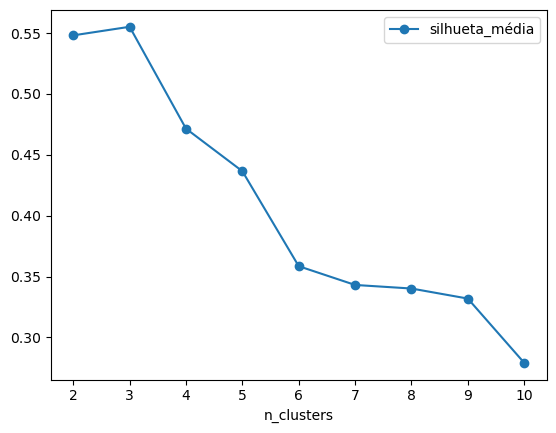

In [73]:
# Plotando o gráfico da silhueta média

df_silhueta = pd.DataFrame({'n_clusters': list(range(2, max_clusters+1)), 'silhueta_média': silhuetas})

df_silhueta.plot(x = 'n_clusters', y='silhueta_média', marker='o')

df_silhueta

O método indica a utilização de 3 grupos, para este caso.

#####  Interpretando os grupos

Agora vamos fazer análises descritivas para observar a utilidade dos grupos. Essa análise é mais importante que indicadores de somas de quadrados, silhueta ou qualquer outro. Aqui vamos tentar identificar se os grupos são diferentes, qual a característica deles e no limite, dar nomes a eles.

Podemos analisar as variáveis que utilizamos nos agrupamentos, fazendo boxplots e gráficos de médias, e podemos validar os agrupamentos analisando variáveis que não utilizamos para treinar o algoritmo.

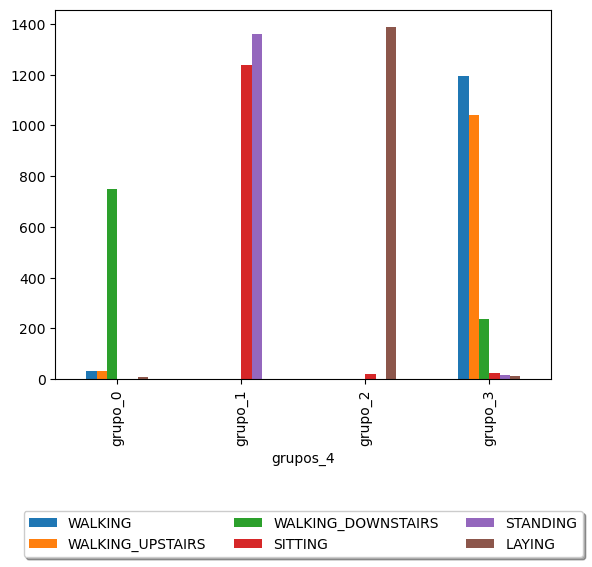

In [115]:
ax = X_pad.groupby(['grupos_4', 'y'], observed=False)['y'].count().unstack().plot.bar()
ax.legend(loc='lower center', bbox_to_anchor=[.5, -.5], ncol=3, fancybox=True, shadow=True);

In [144]:
def dataviz_grupos(varx, varg):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=[10,8])

    ax1 = sns.boxplot(ax=ax[0], data=X_pad, x=varx, y=varg, hue=varg)
    ax2 = sns.boxplot(ax=ax[1], data=X_pad, x=varx, y='y', hue='y')

    plt.show()

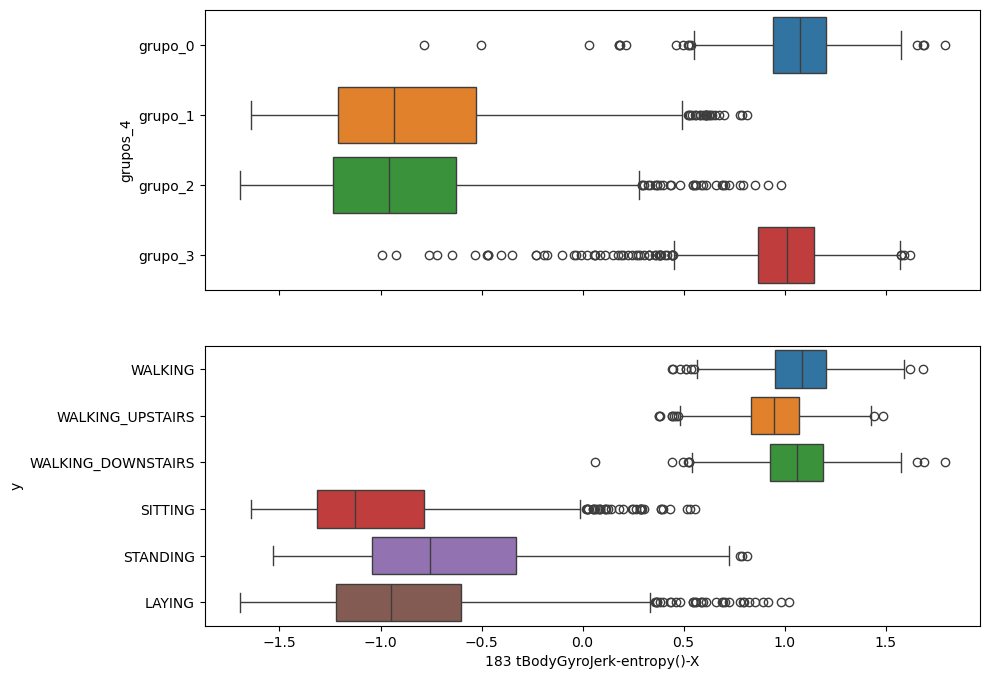

In [146]:
dataviz_grupos(variables[3], 'grupos_4')

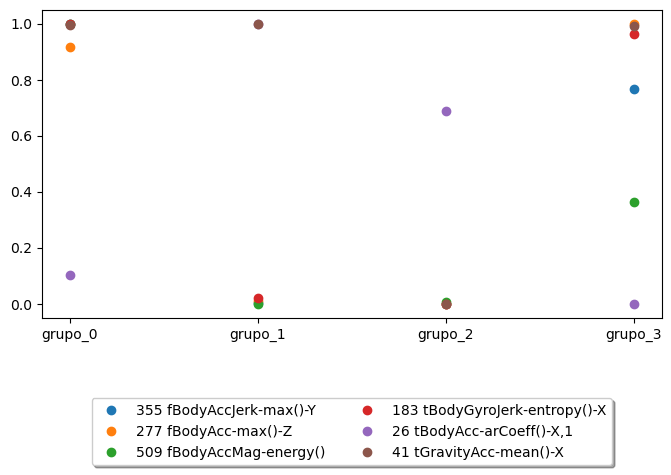

In [186]:
# Um plot das médias das variáveis nos grupos, padronizadas entre 0 e 1

padroniza = lambda x: (x-x.min())/(x.max() - x.min()) 

fig, ax = plt.subplots(figsize=[8,4])

ax.plot(X_pad.groupby(['grupos_4'], observed=False)[variables].mean().apply(padroniza), 'o ')
ax.legend(variables, loc='lower center', bbox_to_anchor=[.5, -.5], ncol=2, fancybox=True, shadow=True)

In [182]:
# the crosstable

pd.crosstab(X_pad.y, X_pad.grupos_4)

grupos_4,grupo_0,grupo_1,grupo_2,grupo_3
y,,,,
WALKING,33,0,0,1193
WALKING_UPSTAIRS,32,0,0,1041
WALKING_DOWNSTAIRS,750,0,0,236
SITTING,2,1239,20,25
STANDING,0,1359,0,15
LAYING,8,0,1387,12


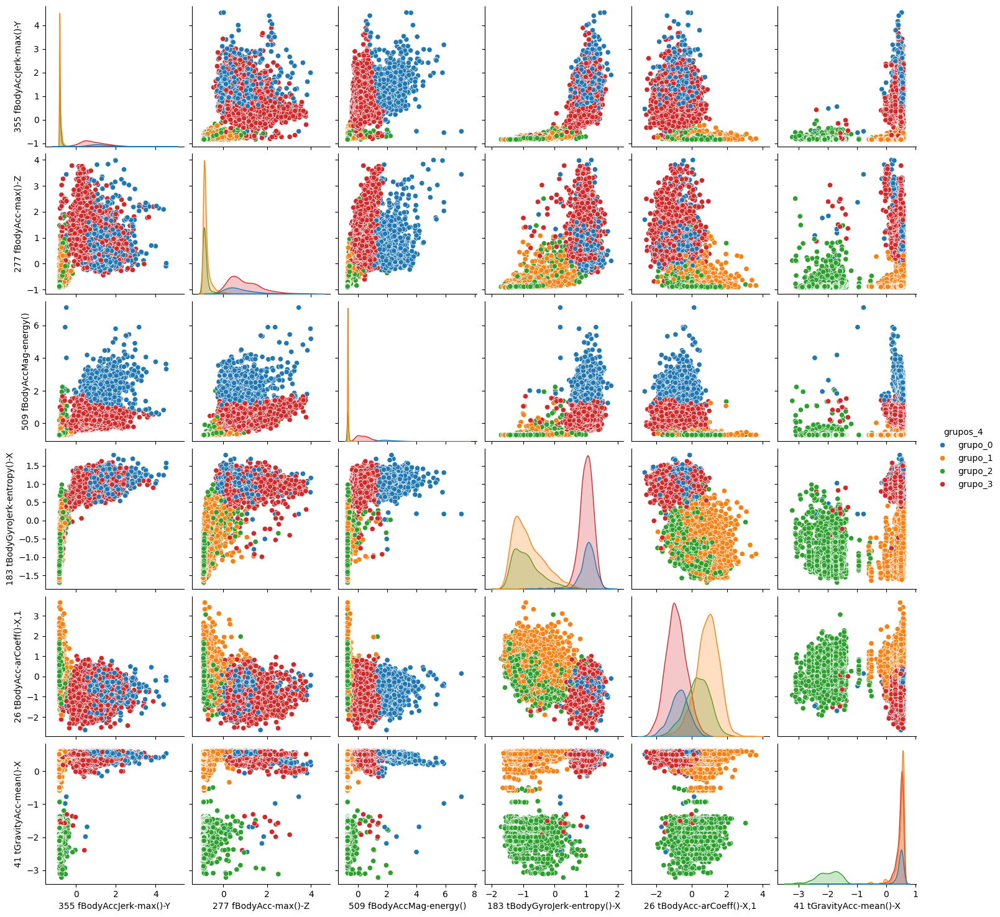

In [199]:
n_clusters = 4
var_grupo = 'grupos_' + str(n_clusters)
sns.pairplot(X_pad[variables + [var_grupo]], hue=var_grupo)
plt.savefig('./output/5-silhueta_clusters.png', dpi=200)

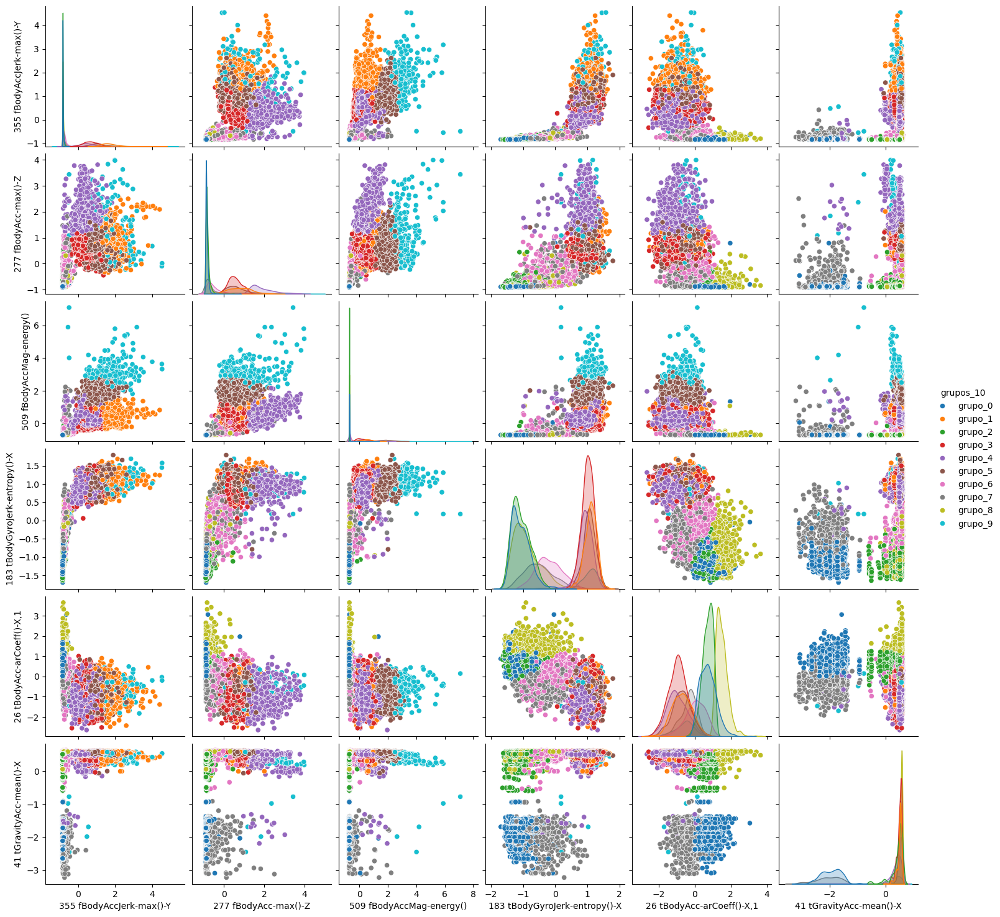

In [203]:
n_clusters = 10
var_grupo = 'grupos_' + str(n_clusters)
sns.pairplot(X_pad[variables + [var_grupo]], hue=var_grupo)
plt.savefig('./output/5-silhueta_clusters_.png', dpi=200)

In [205]:
# Análise biplot baseado em componentes principais

pca = PCA(n_components=2)
componentes = pca.fit_transform(X_pad[variables])

In [217]:
pca.explained_variance_, pca.explained_variance_ratio_

(array([4.03140514, 0.88794682]), array([0.67180947, 0.14797101]))

In [315]:
def biplot(score, coeff, y, labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 2/(xs.max() - xs.min())
    scaley = 2/(ys.max() - ys.min())

    fig, ax = plt.subplots(figsize=[10,10])
    # scatter = ax.scatter(xs*scalex, ys*scaley, c=y)
    sns.kdeplot(x=xs*scalex, y=ys*scaley, hue=y, ax=ax, fill=True, alpha=.6, palette='viridis')

    for i in range(n):
        ax.arrow(0,0,coeff[i,0], coeff[i,1], color='r', alpha=.5,
                length_includes_head=True, head_width=.04, head_length=.04)
        if labels is None:
            ax.text(coeff[i,0]*1.15, coeff[i,1]*1.15, 'var'+str(i+1), color='k', ha='center', va='center')
        else:
            ax.text(coeff[i,0]*1.15, coeff[i,1]*1.15, labels[i], color='k', ha='center', va='center')

    ax.set_xlim(-1.2, 1.2)
    ax.set_ylim(-1.2, 1.2)
    ax.set_xlabel('PC{0}, {1:.1%} da variância explicada'.format(1, pca.explained_variance_ratio_[0]))
    ax.set_ylabel('PC{0}, {1:.1%} da variância explicada'.format(2, pca.explained_variance_ratio_[1]))
    ax.grid()

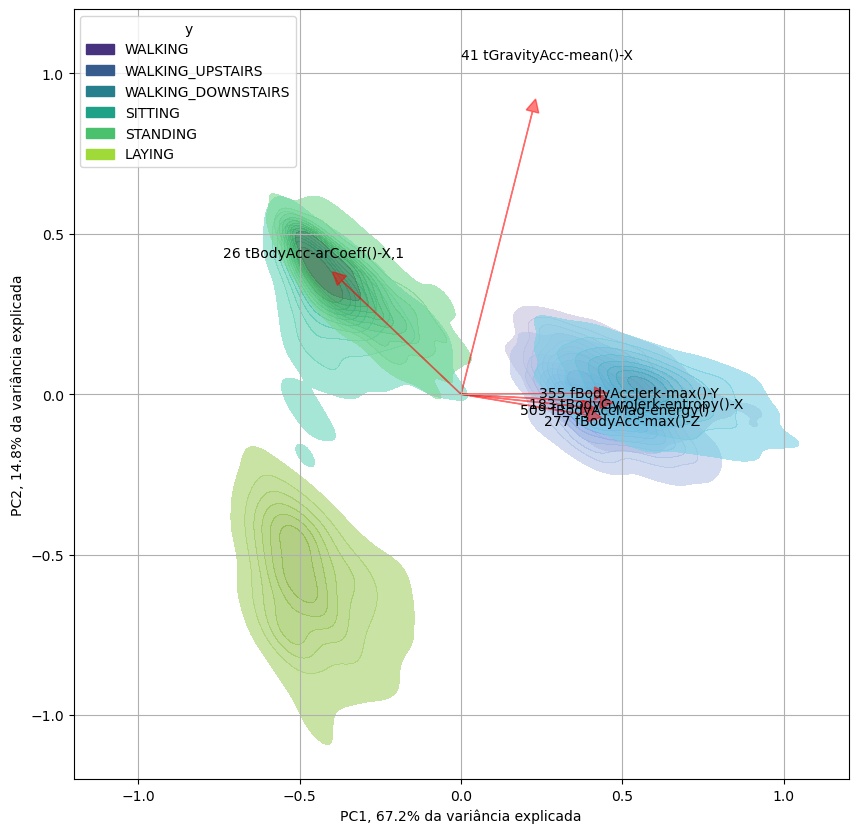

In [319]:
biplot(componentes, 
      np.transpose(pca.components_[0:2, :]),
      X_pad['y'],
      labels=variables)
plt.savefig('./output/biplot_y.png', dpi=200)

In [320]:
np.transpose(pca.components_[0:2, :])

array([[ 0.4534621 ,  0.00271929],
       [ 0.43453044, -0.07208654],
       [ 0.41484505, -0.04360209],
       [ 0.470899  , -0.02670343],
       [-0.39791831,  0.38153448],
       [ 0.23102847,  0.92011595]])

In [321]:
np.transpose(pca.components_)

array([[ 0.4534621 ,  0.00271929],
       [ 0.43453044, -0.07208654],
       [ 0.41484505, -0.04360209],
       [ 0.470899  , -0.02670343],
       [-0.39791831,  0.38153448],
       [ 0.23102847,  0.92011595]])

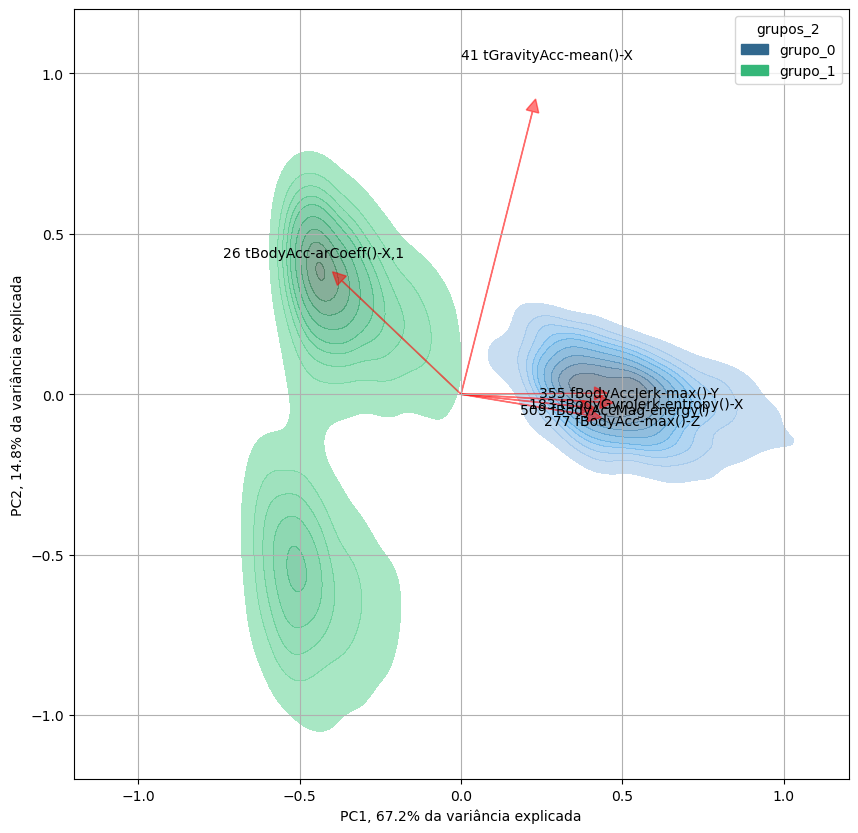

In [322]:
biplot(componentes, 
      np.transpose(pca.components_[0:2, :]),
      X_pad['grupos_2'],
      labels=variables)
plt.savefig('./output/biplot_grupos_2.png', dpi=200)
plt.show()

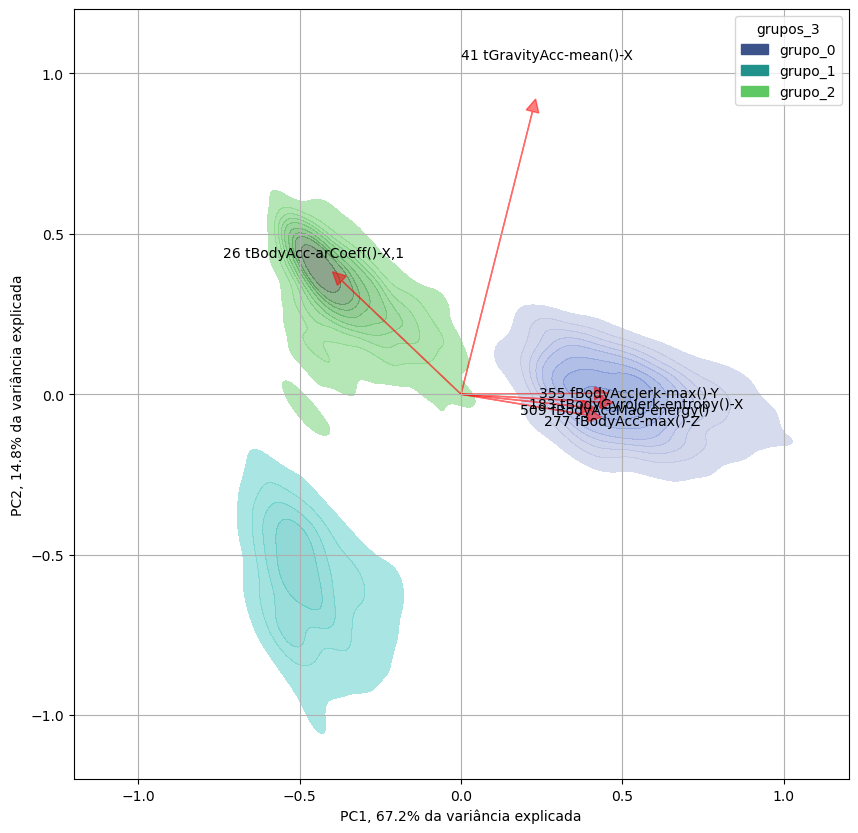

In [323]:
biplot(componentes, 
      np.transpose(pca.components_[0:2, :]),
      X_pad['grupos_3'],
      labels=variables)
plt.savefig('./output/biplot_grupos_3.png', dpi=200)
plt.show()

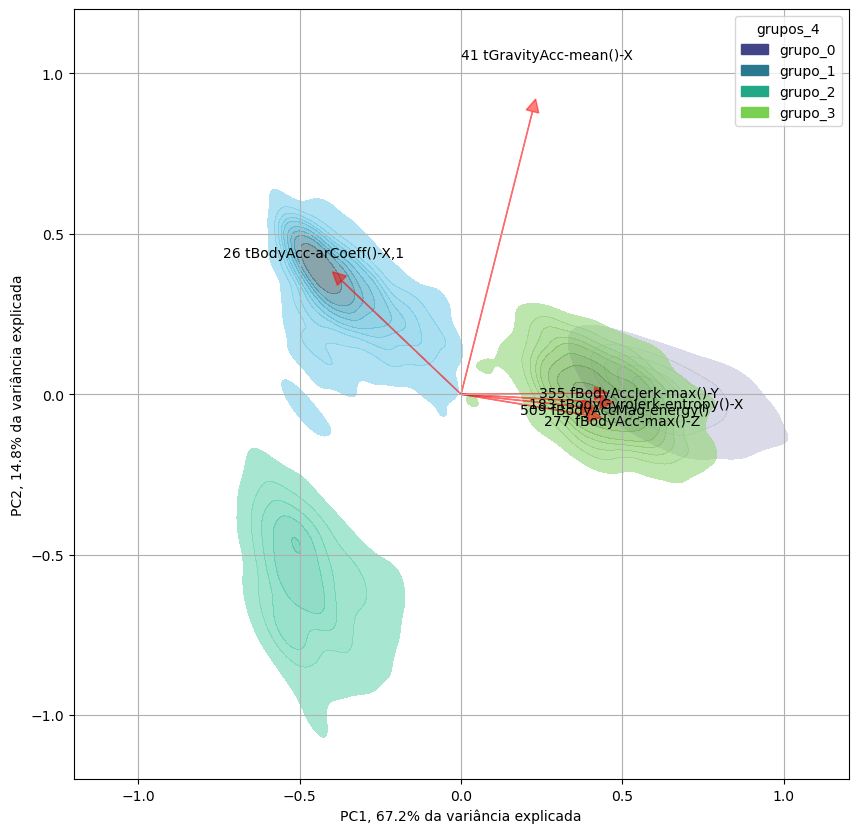

In [324]:
biplot(componentes, 
      np.transpose(pca.components_[0:2, :]),
      X_pad['grupos_4'],
      labels=variables)
plt.savefig('./output/biplot_grupos_4.png', dpi=200)
plt.show()

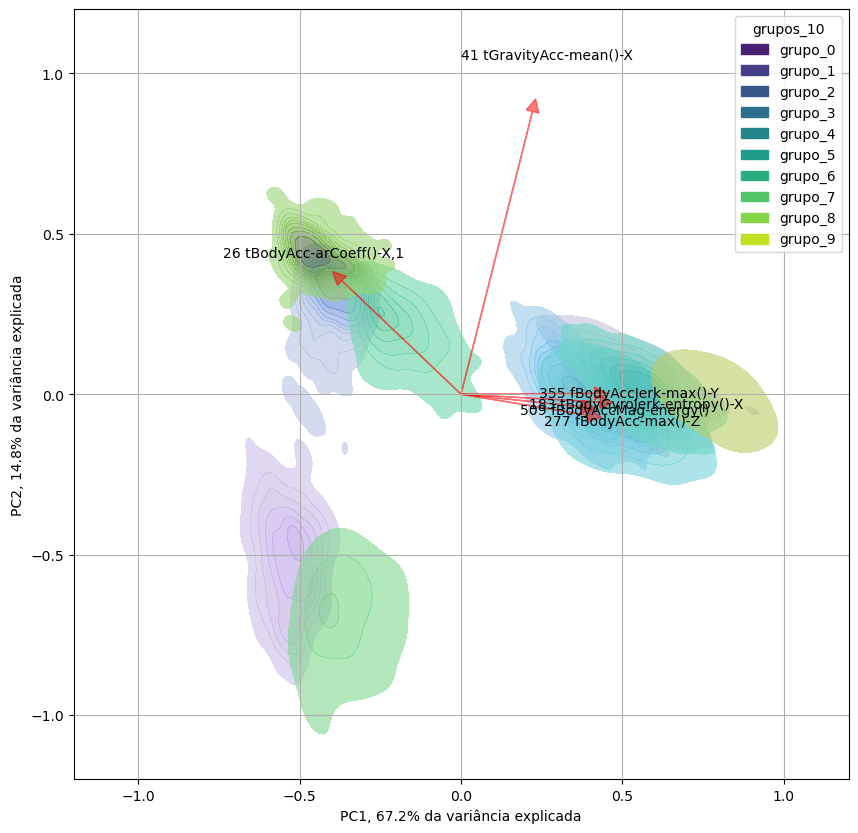

In [325]:
biplot(componentes, 
      np.transpose(pca.components_[0:2, :]),
      X_pad['grupos_10'],
      labels=variables)
plt.savefig('./output/biplot_grupos_10.png', dpi=200)
plt.show()

**As melhores soluções são 3 e 4 grupos, uma vez que separam bem os dados. Se o caso for analisar sedentário e não sedentário, pode-se utilizar apenas 2 grupos.**